# 0. Import Modules 

In [1]:
# Import Modules
import os
import requests
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.ticker as mtick

from matplotlib.ticker import FuncFormatter
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from PIL import Image
from io import BytesIO
from difflib import get_close_matches

# 1. Data Loading

In [2]:
# Path to the folder containing the CSV files
data_path = "../data"

# File names from 2015 to 2022
file_names = [f"players_{year}" for year in range(15, 23)]

# List to store processed dataframes
club_wages_list = []

# Loop through each file, process and store
for year in range(15, 23):
    file_path = os.path.join(data_path, f"players_{year}.csv")
    df = pd.read_csv(file_path, low_memory=False)
    
    # Keep only relevant columns
    df_reduced = df[['wage_eur', 'league_name', 'club_name', 'club_logo_url']].copy()
    
    # Group by club and sum wages
    df_grouped = df_reduced.groupby('club_name').agg({
        'wage_eur': 'sum',
        'league_name': 'first',        # Assume all players from the same club are in the same league
        'club_logo_url': 'first'       # Assume all players have the same club logo
    }).reset_index()
    
    # Rename and add season info
    df_grouped.rename(columns={'wage_eur': 'total_wage'}, inplace=True)
    df_grouped['season'] = f"20{year}/20{year+1}"
    
    club_wages_list.append(df_grouped)

# Duplicate 2022 data as 2023
df_2022 = club_wages_list[-1].copy()
df_2022['season'] = "2023/2024"
club_wages_list.append(df_2022)

# Concatenate all seasons
all_wages = pd.concat(club_wages_list, ignore_index=True)

# Final step: total wage spent per club across all seasons
total_spent_by_club = (
    all_wages.groupby('club_name')
    .agg({
        'total_wage': 'sum',
        'league_name': 'last',
        'club_logo_url': 'last'
    })
    .reset_index()
    .rename(columns={'total_wage': 'total_wage_spent_2015_2023'})
)

In [3]:
# Load data
try:
    df_clubs = pd.read_csv(f"{data_path}/tm_clubs.csv")
    df_transfers = pd.read_csv(f"{data_path}/tm_transfers.csv")
    df_club_games = pd.read_csv(f"{data_path}/tm_club_games.csv")
    df_competitions = pd.read_csv(f"{data_path}/tm_competitions.csv")    
    print("Files loaded successfully")
except FileNotFoundError:
    print(f"Error: One or more files at {data_path} were not found.")
    exit()

Files loaded successfully


# 2. Data Cleaning

In [4]:
# Modification of transfer_season column to preserve order
def expand_season(season_str):
    start_year = int(season_str[:2])
    end_year = int(season_str[3:])

    if start_year < 70:  # Consider that are 20xx
        start_full = 2000 + start_year
        end_full = 2000 + end_year
    else:  # Consider that are 19xx
        start_full = 1900 + start_year
        end_full = 1900 + end_year

    return f"{start_full}/{str(end_full)[-2:]}"

df_transfers['transfer_season'] = df_transfers['transfer_season'].apply(expand_season) 

Data from 2025 onwards must be deleted, as the data is incomplete as of August 2025. This will prevent bias in the results.

In [5]:
# Convert transfer_date into datetime type
df_transfers['transfer_date'] = pd.to_datetime(df_transfers['transfer_date'], errors='coerce')

# Remove data from 2025 onward 
df_transfers = df_transfers[
    df_transfers['transfer_date'] <= pd.Timestamp('2024-12-31')
].copy()

# Still remain noisy data from 2025 onward
df_transfers[
    df_transfers['transfer_season'].str.split('/').str[0].astype(int) >= 2025
]

,player_id,transfer_date,transfer_season,from_club_id,to_club_id,from_club_name,to_club_name,transfer_fee,market_value_in_eur,player_name
5950,1027067,2024-07-01,2025/26,67278,67279,St. Johnst. U18,St. Johnst. B,NaN,NaN,Bayley Klimionek
6754,551752,2024-06-30,2025/26,8970,416,Frosinone,Torino,0.0,2000000.0,Demba Seck


In [6]:
# Complete the cleaning process
df_transfers = df_transfers[
    df_transfers['transfer_season'].str.split('/').str[0].astype(int) <= 2024
].copy()

df_transfers[
    df_transfers['transfer_season'].str.split('/').str[0].astype(int) >= 2025
]

,player_id,transfer_date,transfer_season,from_club_id,to_club_id,from_club_name,to_club_name,transfer_fee,market_value_in_eur,player_name


### 2.1. Cleaning Missing Values

The treatment of missing values is essential in any data analysis. Therefore, we will now check which variables are missing in order to understand the nature of this dataset and perform a thorough cleanup.

In [7]:
# Check missing values in the dataset
missing_values = df_transfers.isnull().sum()

# Display the missing values for each column
missing_values

player_id                  0
transfer_date              0
transfer_season            0
from_club_id               0
to_club_id                 0
from_club_name             0
to_club_name               0
transfer_fee           27512
market_value_in_eur    30211
player_name                0
dtype: int64

In [8]:
# Check how many rows have missing values in both columns, transfer_fee and market_value_in_eur
missing_both_values = df_transfers[
    df_transfers['transfer_fee'].isnull() & df_transfers['market_value_in_eur'].isnull()
]

# 3. EDA (Exploratory Data Analysis)

### 3.1. Creation of Clean Datasets

Depending on the analysis to be performed on each occasion, it is important to have the appropriate dataset. That is why different datasets will be created, which will be used at the most appropriate time for each one.

#### 3.1.1. Cleaned-Both Dataset: Created by removing any row with missing values in _transfer_fee_ or _market_value_in_eur_

On this scenario, it will be necessary to ensure that the dataset is as accurate as possible, while taking into account the handicap of having fewer records available.

In [9]:
# Create a new dataframe with the cleaned data
df_transfers_cleaned_both = df_transfers.dropna(
    subset=['transfer_fee', 'market_value_in_eur'],
    how='any'
).copy()

# Show the dataset information that have been recently cleaned
print(f"Dataset Shape: {df_transfers_cleaned_both.shape}")
print(f"\nMissing Values:\n{df_transfers_cleaned_both.isnull().sum()}")

Dataset Shape: (39378, 10)

Missing Values:
player_id              0
transfer_date          0
transfer_season        0
from_club_id           0
to_club_id             0
from_club_name         0
to_club_name           0
transfer_fee           0
market_value_in_eur    0
player_name            0
dtype: int64


In [10]:
# Last 10-year cumulative profitability donut (AFTER wages × active seasons)

# Define rolling 10-year window
last_year  = df_transfers_cleaned_both['transfer_date'].dt.year.max()
start_year = int(last_year) - 9

# Filter, clean, and keep only last 10 years
df_base = (
    df_transfers_cleaned_both
      .dropna(subset=['transfer_fee', 'transfer_date'])
      .assign(year=lambda d: d['transfer_date'].dt.year)
      .loc[lambda d: d['year'].between(start_year, last_year)]
)

# Cumulative transfer income per club (as seller)
income_by_club = (
    df_base
      .groupby('from_club_id', as_index=False)
      .agg(total_income=('transfer_fee', 'sum'))
      .rename(columns={'from_club_id': 'club_id'})
)

# Cumulative transfer spend per club (as buyer)
spend_by_club = (
    df_base
      .groupby('to_club_id', as_index=False)
      .agg(total_spent=('transfer_fee', 'sum'))
      .rename(columns={'to_club_id': 'club_id'})
)

# Merge to club-level balance (10Y window)
club_balance_total = (
    pd.merge(income_by_club, spend_by_club, on='club_id', how='outer')
      .fillna(0)
).copy()

# Attach competition ID to each club
club_balance_total = club_balance_total.merge(
    df_clubs[['club_id', 'domestic_competition_id']],
    on='club_id', how='left'
).copy()



Merging with the salaries 

In [11]:
df_clubs['club_id'] = df_clubs['club_id'].astype(int)
club_balance_total['club_id'] = club_balance_total['club_id'].astype(int)
df_clubs_merged = club_balance_total.merge(
    df_clubs[['club_id', 'name']],
    on='club_id',
    how='left'
)

df_clubs_merged = df_clubs_merged.dropna(subset=['name']).reset_index(drop=True)

### 3.2. Creation of useful maps 

In [12]:
country_map = {
    "L1": "Germany",
    "FR1": "France",
    "IT1": "Italy",
    "ES1": "Spain",
    "GB1": "England"
}

In [13]:
big5_leagues = [
    # Germany
    "German 1. Bundesliga",
    "German 2. Bundesliga",
    "German 3. Bundesliga",

    # France
    "French Ligue 1",
    "French Ligue 2",

    # Italy
    "Italian Serie A",
    "Italian Serie B",

    # Spain
    "Spain Primera Division",
    "Spanish Segunda División",

    # England
    "English Premier League",
    "English League Championship",
    "English League One",
    "English League Two"
]
df_big5 = total_spent_by_club[
    total_spent_by_club['league_name'].isin(big5_leagues)
].reset_index(drop=True)

df_big5['league_name'].value_counts()

league_name
Spanish Segunda División       42
Italian Serie B                38
German 3. Bundesliga           34
French Ligue 2                 33
English League Two             33
English League One             25
English League Championship    24
Italian Serie A                20
French Ligue 1                 20
English Premier League         20
Spain Primera Division         20
German 2. Bundesliga           19
German 1. Bundesliga           18
Name: count, dtype: int64

In [14]:
league_to_code = {
    # Germany
    "German 1. Bundesliga": "L1",
    "German 2. Bundesliga": "L1",
    "German 3. Bundesliga": "L1",

    # France
    "French Ligue 1": "FR1",
    "French Ligue 2": "FR1",

    # Italy
    "Italian Serie A": "IT1",
    "Italian Serie B": "IT1",

    # Spain
    "Spain Primera Division": "ES1",
    "Spanish Segunda División": "ES1",

    # England
    "English Premier League": "GB1",
    "English League Championship": "GB1",
    "English League One": "GB1",
    "English League Two": "GB1"
}

df_big5["country_code"] = df_big5["league_name"].map(league_to_code)
df_big5[df_big5["country_code"].isna()]["league_name"].unique()

array([], dtype=object)

In [15]:
df_clubs_merged = df_clubs_merged.rename(columns={"name": "club_name"})
df_clubs_merged

big5_codes = ["L1", "FR1", "IT1", "ES1", "GB1"]

df_clubs_merged_big5 = df_clubs_merged[
    df_clubs_merged["domestic_competition_id"].isin(big5_codes)
].reset_index(drop=True)

### 3.3. Check Unmatched Clubs

In [16]:
# Fuzzy Matching by Country (Automatic Phase)
def fuzzy_match_single(name, choices, cutoff=0.60):
    """
    Returns the closest fuzzy match (using difflib) 
    or None if no match is above the cutoff.
    """
    if pd.isna(name) or str(name).strip() == "":
        return None
    matches = get_close_matches(name, choices, n=1, cutoff=cutoff)
    return matches[0] if matches else None

# Group wage clubs by country_code to reduce search space
country_to_clubs_big5 = (
    df_big5.groupby("country_code")["club_name"]
    .apply(list)
    .to_dict()
)

matched_club_names = []
matched_wages = []
matched_logos = []


for idx, row in df_clubs_merged_big5.iterrows():
    club_name = row["club_name"]
    country = row["domestic_competition_id"]

    # Candidate wage clubs from the same country
    candidates = country_to_clubs_big5.get(country, [])

    # Fuzzy match attempt
    best_match = fuzzy_match_single(club_name, candidates, cutoff=0.55)

    if best_match:
        salary_row = df_big5[df_big5["club_name"] == best_match].iloc[0]
        matched_club_names.append(best_match)
        matched_wages.append(salary_row["total_wage_spent_2015_2023"])
        matched_logos.append(salary_row["club_logo_url"])  
    else:
        matched_club_names.append(None)
        matched_wages.append(None)
        matched_logos.append(None)                     

df_clubs_merged_big5["club_logo_url"] = matched_logos

# Add fuzzy match results
df_clubs_merged_big5["matched_club"] = matched_club_names
df_clubs_merged_big5["total_wage_spent_2015_2023"] = matched_wages


# Identify All Unmatched Clubs
unmatched_df = df_clubs_merged_big5[df_clubs_merged_big5["matched_club"].isna()]
unmatched_list = unmatched_df["club_name"].tolist()

# Keyword Map for Manual Matching of All Countries
keyword_map = {
    # Italy
    "Associazione Calcio Milan": ["milan"],
    "Associazione Sportiva Roma": ["roma"],
    "Football Club Internazionale Milano S.p.A.": ["inter", "internazionale", "milano"],
    "Genoa Cricket and Football Club": ["genoa"],
    "Verona Hellas Football Club": ["verona", "hellas"],
    "Società Sportiva Lazio S.p.A.": ["lazio"],
    "Associazione Calcio Fiorentina": ["fiorentina"],
    "Juventus Football Club": ["juventus"],
    "Empoli Football Club S.r.l.": ["empoli"],
    "Atalanta Bergamasca Calcio S.p.a.": ["atalanta"],
    "Unione Sportiva Lecce": ["lecce"],
    "Bologna Football Club 1909": ["bologna"],
    "Calcio Como": ["como"],
    "Associazione Calcio Monza": ["monza"],
    "Delfino Pescara 1936": ["pescara"],
    "Società Sportiva Calcio Napoli": ["napoli"],

    # England
    "Arsenal Football Club": ["arsenal"],
    "Everton Football Club": ["everton"],
    "Chelsea Football Club": ["chelsea"],
    "Fulham Football Club": ["fulham"],

    # Spain
    "Real Club Deportivo Mallorca S.A.D.": ["mallorca"],
    "Valencia Club de Fútbol S.A.D.": ["Valencia CF"],
    "Getafe Club de Fútbol S.A.D. Team Dubai": ["getafe"],
    "Girona Fútbol Club S. A. D.": ["girona"],

    # Frane
    "Association de la Jeunesse auxerroise": ["auxerre"],
    "Olympique Gymnaste Club Nice Côte d'Azur": ["nice"],
    "Association sportive de Saint-Étienne Loire": ["saint", "etienne"],
    "Lille Olympique Sporting Club": ["lille"],
    "SM Caen": ["caen"],
    "Thonon Évian Grand Genève FC": ["evian", "thonon", "geneve"],

    # Germany
    "1. Fußball- und Sportverein Mainz 05": ["mainz"],
    "Verein für Bewegungsspiele Stuttgart 1893": ["stuttgart"],
    "Verein für Leibesübungen Bochum 1848 Fußballgemeinschaft": ["bochum"],
    "Kieler Sportvereinigung Holstein von 1900": ["kiel"],
    "Turn- und Sportgemeinschaft 1899 Hoffenheim Fußball": ["Hoffenheim", "hoff"], 
}


# Auto-Generate Manual Map from Keywords
manual_map_auto = {}

for long_name, keys in keyword_map.items():
    matches = df_big5[
        df_big5["club_name"].str.lower().apply(
            lambda x: any(k in x for k in keys)
        )
    ]["club_name"].unique()

    if len(matches) == 1:
        manual_map_auto[long_name] = matches[0]
    elif len(matches) > 1:
        print(f"Multiple Matches for {long_name}: {matches}")
    else:
        print(f"No Match Found for {long_name}")

# Forced corrections for ambiguous cases
manual_map_auto["Verona Hellas Football Club"] = "Hellas Verona"
manual_map_auto["Association sportive de Saint-Étienne Loire"] = "AS Saint-Étienne"

# Final Fixes for Last Unmatched Clubs
manual_map_auto["Turn- und Sportgemeinschaft 1899 Hoffenheim Fußball-Spielbetriebs"] = "TSG Hoffenheim"
manual_map_auto["Valencia Club de Fútbol S. A. D."] = "Valencia CF"

# Apply Manual Map to Fill Remaining Unmatched Clubs
# Update matched_club with manual matches
df_clubs_merged_big5["matched_club"] = df_clubs_merged_big5.apply(
    lambda row: manual_map_auto.get(row["club_name"], row["matched_club"]),
    axis=1
)
# Update logo URLs based on final matched_club
df_clubs_merged_big5["club_logo_url"] = df_clubs_merged_big5.apply(
    lambda row: df_big5.loc[df_big5["club_name"] == row["matched_club"], "club_logo_url"].values[0]
    if pd.notna(row["matched_club"]) else row["club_logo_url"],
    axis=1
)

# Update wages based on final matched_club
df_clubs_merged_big5["total_wage_spent_2015_2023"] = df_clubs_merged_big5.apply(
    lambda row: df_big5.loc[df_big5["club_name"] == row["matched_club"], "total_wage_spent_2015_2023"].values[0]
    if pd.notna(row["matched_club"]) else row["total_wage_spent_2015_2023"],
    axis=1
)

# Show Final Results
print("Unmatched Clubs after Manual Map:")
display(
    df_clubs_merged_big5[
        df_clubs_merged_big5["matched_club"].isna()
    ][["club_name", "domestic_competition_id"]]
)

Multiple Matches for Verona Hellas Football Club: ['Chievo Verona' 'Hellas Verona']
No Match Found for Valencia Club de Fútbol S.A.D.
Multiple Matches for Association sportive de Saint-Étienne Loire: ['AS Saint-Étienne' 'Paris Saint-Germain']
Unmatched Clubs after Manual Map:


,club_name,domestic_competition_id


In [17]:
#output_path = r"C:\Users\alesa\Desktop\data\df_clubs_final_big5.csv"
#df_clubs_merged_big5.to_csv(output_path, index=False, encoding="utf-8")
#print("Saved successfully to:", output_path)

# 4. Insights 

In [18]:
df = df_clubs_merged_big5.copy()

# Compute Return
df["return"] = (
    df["total_income"]
    - df["total_spent"]
    - df["total_wage_spent_2015_2023"]
)

# Ensure df exists. If return doesn't exist, compute it.
if "return" not in df.columns:
    df["return"] = (
        df["total_income"]
        - df["total_spent"]
        - df["total_wage_spent_2015_2023"]
    )

# Classify profitability
df["is_profitable"] = df["return"] > 0

# Percentages
profitable_pct = df["is_profitable"].mean() * 100
not_profitable_pct = 100 - profitable_pct

print(f"Percentage of profitable clubs: {profitable_pct:.2f}%")
print(f"Percentage of NOT profitable clubs: {not_profitable_pct:.2f}%")

Percentage of profitable clubs: 58.38%
Percentage of NOT profitable clubs: 41.62%


### 4.1. Win Rates 

In [19]:
# Check missing values in the dataset
missing_values = df_club_games.isnull().sum()
missing_values

game_id                      0
club_id                     18
own_goals                   24
own_position             44934
own_manager_name          1656
opponent_id                 18
opponent_goals              24
opponent_position        44934
opponent_manager_name     1656
hosting                      0
is_win                       0
dtype: int64

In [20]:
# Create a new dataframe with the cleaned data
df_club_games_cleaned = df_club_games.dropna(
  subset=['club_id']
).copy()

# Show the dataset information that have been recently cleaned
print(f"Dataset Shape: {df_club_games_cleaned.shape}")
print(f"\nMissing Values:\n{df_club_games_cleaned.isnull().sum()}")

Dataset Shape: (148034, 11)

Missing Values:
game_id                      0
club_id                      0
own_goals                    6
own_position             44916
own_manager_name          1638
opponent_id                  0
opponent_goals               6
opponent_position        44916
opponent_manager_name     1638
hosting                      0
is_win                       0
dtype: int64


In [21]:
# Win rate by club_id
winrate_by_club = (
    df_club_games
      .groupby('club_id')
      .agg(
          games_played = ('game_id', 'count'),
          wins         = ('is_win', 'sum')
      )
)

winrate_by_club['win_rate'] = (winrate_by_club['wins'] / winrate_by_club['games_played']) * 100
winrate_by_club = winrate_by_club.sort_values('win_rate', ascending=False)
winrate_by_club = winrate_by_club[winrate_by_club['games_played'] > 13]

winrate_by_club_competitions = winrate_by_club.merge(
    df_clubs[['club_id', 'name', 'domestic_competition_id']],
    on='club_id'
)

In [22]:
# TOP 5 Leagues
top5_leagues = ["GB1", "ES1", "IT1", "FR1", "L1"]

# Filter: only clubs with >10 matches AND in Top 5 leagues
win_rate_filtered = winrate_by_club_competitions[
    (winrate_by_club_competitions['games_played'] > 10) &
    (winrate_by_club_competitions['domestic_competition_id'].isin(top5_leagues))
]

In [23]:
# Top 5 leagues
top5_leagues = ["GB1", "ES1", "IT1", "FR1", "L1"]

# Filter df for Top 5 leagues only
filtered = df[df["domestic_competition_id"].isin(top5_leagues)].copy()

# Compute RETURN if not already present
filtered["return"] = (
    filtered["total_income"]
    - filtered["total_spent"]
    - filtered["total_wage_spent_2015_2023"]
)

# Variables to plot
variables = {
    "total_income": "Total Income (€)",
    "total_spent": "Total Spending (€)",
    "total_wage_spent_2015_2023": "Total Wage Spending 2015-2023 (€)",
    "return": "Net Return (€)"
}

### 4.2. Return of Performance

In [24]:
# Inner Join on club_id
return_on_performance_df = win_rate_filtered.merge(
    filtered,
    on="club_id",
    how="inner",
    suffixes=("_performance", "_financial")
)

# CHECK FOR LOST CLUBS (diagnostics)
winrate_ids = set(win_rate_filtered["club_id"].unique())
return_ids = set(filtered["club_id"].unique())
joined_ids = set(return_on_performance_df["club_id"].unique())

lost_from_winrate = winrate_ids - joined_ids
lost_from_return = return_ids - joined_ids

print("\nClubs present in win_rate_filtered but NOT in final dataset:")
print(sorted(lost_from_winrate))

print("\nClubs present in filtered but NOT in final dataset:")
print(sorted(lost_from_return))

print("\nIf both lists are empty, then no Clubs were lost.")


Clubs present in win_rate_filtered but NOT in final dataset:
[]

Clubs present in filtered but NOT in final dataset:
[]

If both lists are empty, then no Clubs were lost.


In [25]:
return_on_performance_df.loc[return_on_performance_df["club_id"] == 1244, "club_logo_url"] = "https://cdn.sofifa.net/teams/100888/60.png"

### 4.3. Metrics

Are leagues top-heavy or balanced? In other words: Are a few clubs dominating (like PSG, Bayern), or is success more equally distributed? Metrics computed (per league):
- Standard Deviation (std) of win rate → More spread = more inequality
- Coefficient of Variation (CV) = std / mean → Normalized measure across leagues
- Gini Coefficient → Economic-style inequality measure (0 = perfect equality, 1 = total inequality)
- Herfindahl-Hirschman Index (HHI) → Sum of squared win shares (used in competition law)

In [26]:
return_filtered = filtered.copy()

# Filter values other than zero
non_zero_profit = filtered[filtered['return'] != 0]

# Calculate percentage of positives and negatives
positive_pct = (non_zero_profit['return'] > 0).mean() * 100
negative_pct = (non_zero_profit['return'] < 0).mean() * 100

print(f"Percentage with positive profit: {positive_pct:.2f}%")
print(f"Percentage with loss (negative): {negative_pct:.2f}%")

Percentage with positive profit: 58.38%
Percentage with loss (negative): 41.62%


In [27]:
win_rate_filtered = win_rate_filtered.rename(columns={"name": "club_name"})

# Inner Join on club_id
return_on_performance_df = win_rate_filtered.merge(
    return_filtered,
    on="club_id",
    how="inner",
    suffixes=("_performance", "_financial")
)

print("Joined dataframe shape:", return_on_performance_df.shape)


# Check for Lost Clubs (diagnostics)

winrate_ids = set(win_rate_filtered["club_id"].unique())
return_ids = set(return_filtered["club_id"].unique())
joined_ids = set(return_on_performance_df["club_id"].unique())

lost_from_winrate = winrate_ids - joined_ids
lost_from_return = return_ids - joined_ids

print("\nClubs present in win_rate_filtered but NOT in final dataset:")
print(sorted(lost_from_winrate))

print("\nClubs present in return_filtered but NOT in final dataset:")
print(sorted(lost_from_return))

print("\nIf both lists are empty, then no Clubs were lost.")

Joined dataframe shape: (173, 15)

Clubs present in win_rate_filtered but NOT in final dataset:
[]

Clubs present in return_filtered but NOT in final dataset:
[]

If both lists are empty, then no Clubs were lost.


In [28]:
# Calculate average income per active season
# Calculate average total income and average adjusted balance after wages
avg_income = return_on_performance_df['total_income'].mean()
avg_spent = return_on_performance_df['total_spent'].mean()
avg_return = return_on_performance_df['return'].mean()

# Display results formatted as euros
print(f"Average Total Income: €{avg_income:,.0f}")
print(f"Average Spent: €{avg_spent:,.0f}")
print(f"Average Return: €{avg_return:,.0f}")

Average Total Income: €192,076,922
Average Spent: €245,501,315
Average Return: €-59,229,055


In [29]:
# Top 5 leagues
top5 = ["GB1", "ES1", "IT1", "FR1", "L1"]

df_league = return_on_performance_df[
    return_on_performance_df["domestic_competition_id_financial"].isin(top5)
].copy()

# Add extra metrics
df_league["spent_per_season"] = df_league["total_spent"] / 8
df_league["return_per_season"] = df_league["return"] / 8

# League-Level Aggregation
league_stats = df_league.groupby("domestic_competition_id_financial").agg({
    "total_income": "mean",
    "total_spent": "mean",
    "return": "mean",
    "win_rate": "mean",
    "spent_per_season": "mean",
    "return_per_season": "mean",
    "is_profitable": "mean"
})

# Rename nicely
league_stats = league_stats.rename(columns={
    "total_income": "avg_income",
    "total_spent": "avg_spent",
    "return": "avg_return",
    "win_rate": "avg_win_rate",
    "spent_per_season": "avg_spent_per_season",
    "return_per_season": "avg_return_per_season",
    "is_profitable": "pct_profitable_clubs"
})


# High-Performance (>50% Win Rate)
high_perf = df_league[df_league["win_rate"] > 50]

high_perf_stats = high_perf.groupby("domestic_competition_id_financial").agg({
    "total_income": "mean",
    "total_spent": "mean",
    "return": "mean",
    "win_rate": "mean",    "spent_per_season": "mean",
    "return_per_season": "mean",
    "is_profitable": "mean"
})

high_perf_stats = high_perf_stats.rename(columns={
    "total_income": "hp_avg_income",
    "total_spent": "hp_avg_spent",
    "return": "hp_avg_return",
    "win_rate": "hp_avg_win_rate",
    "spent_per_season": "hp_avg_spent_per_season",
    "return_per_season": "hp_avg_return_per_season",
    "is_profitable": "hp_pct_profitable_clubs"
})

# Merge Both Tables
full_stats = league_stats.merge(
    high_perf_stats,
    left_index=True,
    right_index=True,
    how="left"
)

# Display
print("League-Level RoP Metrics")
display(full_stats)

League-Level RoP Metrics


,avg_income,avg_spent,avg_return,avg_win_rate,avg_spent_per_season,avg_return_per_season,pct_profitable_clubs,hp_avg_income,hp_avg_spent,hp_avg_return,hp_avg_win_rate,hp_avg_spent_per_season,hp_avg_return_per_season,hp_pct_profitable_clubs
domestic_competition_id_financial,,,,,,,,,,,,,,
ES1,1.617811e+08,1.780448e+08,-2.262186e+07,35.992906,2.225561e+07,-2.827732e+06,0.593750,6.554667e+08,9.987300e+08,-3.745693e+08,65.299167,1.248412e+08,-4.682117e+07,0.000000
FR1,1.729327e+08,1.511784e+08,1.844005e+07,32.271537,1.889730e+07,2.305006e+06,0.828571,6.898833e+08,8.657467e+08,-1.870823e+08,56.552121,1.082183e+08,-2.338529e+07,0.666667
GB1,2.621048e+08,4.939395e+08,-2.413856e+08,35.599169,6.174244e+07,-3.017321e+07,0.297297,5.544633e+08,1.460703e+09,-9.314145e+08,58.136854,1.825879e+08,-1.164268e+08,0.000000
IT1,1.811558e+08,2.077964e+08,-3.109157e+07,33.157556,2.597455e+07,-3.886446e+06,0.552632,5.326620e+08,7.597890e+08,-2.435969e+08,56.259576,9.497362e+07,-3.044961e+07,0.000000
L1,1.747700e+08,1.713234e+08,-1.786471e+06,36.618016,2.141543e+07,-2.233089e+05,0.677419,6.184225e+08,7.160050e+08,-1.119730e+08,59.699722,8.950062e+07,-1.399662e+07,0.250000


In [30]:
# Rename columns
return_on_performance_df = return_on_performance_df.rename(columns={
    "club_id": "club_id",
    "club_name_performance": "club_name",
    "domestic_competition_id_performance": "domestic_competition_id",
    
    "total_spent": "total_spent_transfer_fees",
    "total_wage_spent_2015_2023": "total_spent_wages",
})

# Drep columns you said to eliminate
cols_to_drop = [
    "domestic_competition_id_financial",
    "club_name_financial",
    "matched_club"
]

return_on_performance_df = return_on_performance_df.drop(columns=cols_to_drop)

# Create total_spend column (wages + transfer fees)
return_on_performance_df["total_spent"] = (
    return_on_performance_df["total_spent_transfer_fees"] +
    return_on_performance_df["total_spent_wages"]
)

In [31]:
# Copy df to avoid SettingWithCopy issues
df_league = return_on_performance_df.copy()

# Convert money variables to millions
money_cols = [
    "total_income", "total_spent_transfer_fees", 
    "total_spent_wages", "total_spent", "return"
]

for col in money_cols:
    df_league[col + "_M"] = df_league[col] / 1_000_000

# Top 5 leagues
top5 = ["GB1", "ES1", "IT1", "FR1", "L1"]

df_league_top5 = df_league[df_league["domestic_competition_id"].isin(top5)]

# Group and compute averages (in millions)
league_summary = df_league_top5.groupby("domestic_competition_id").agg({
    "total_income_M": "mean",
    "total_spent_M": "mean",
    "return_M": "mean",
    "win_rate": "mean",
    "is_profitable": "mean"
}).rename(columns={
    "total_income_M": "avg_income_M",
    "total_spent_M": "avg_spent_M",
    "return_M": "avg_return_M",
    "win_rate": "avg_win_rate",
    "is_profitable": "pct_profitable_clubs"
})

# Format output nicely
league_summary = league_summary.round(2)

print("League-Level Summary (Values in Millions €)")
display(league_summary)

League-Level Summary (Values in Millions €)


,avg_income_M,avg_spent_M,avg_return_M,avg_win_rate,pct_profitable_clubs
domestic_competition_id,,,,,
ES1,161.78,184.40,-22.62,35.99,0.59
FR1,172.93,154.49,18.44,32.27,0.83
GB1,262.10,503.49,-241.39,35.60,0.30
IT1,181.16,212.25,-31.09,33.16,0.55
L1,174.77,176.56,-1.79,36.62,0.68


In [32]:
# Filter top 5 leagues
top5 = ["GB1", "ES1", "IT1", "FR1", "L1"]
df_league = return_on_performance_df.copy()

# Convert money values to millions
money_cols = [
    "total_income", "total_spent_transfer_fees",
    "total_spent_wages", "total_spent", "return"
]

for col in money_cols:
    df_league[col + "_M"] = df_league[col] / 1_000_000

# Filter only top 5 leagues
df_league_top5 = df_league[df_league["domestic_competition_id"].isin(top5)]

# Filter teams winning more than 50% of matches
df_top_winners = df_league_top5[df_league_top5["win_rate"] > 50]

# Compute league-level averages
league_summary_winners = df_top_winners.groupby("domestic_competition_id").agg({
    "total_income_M": "mean",
    "total_spent_M": "mean",
    "return_M": "mean",
    "win_rate": "mean",
    "is_profitable": "mean"
})

# Rename nicely
league_summary_winners = league_summary_winners.rename(columns={
    "total_income_M": "avg_income_M",
    "total_spent_M": "avg_spent_M",
    "return_M": "avg_return_M",
    "win_rate": "avg_win_rate",
    "is_profitable": "pct_profitable_clubs"
})

# Format nicely
league_summary_winners = league_summary_winners.round(2)

print("High-Performance Clubs (>50% Win Rate) — League Summary (Values in Millions €)")
display(league_summary_winners)

High-Performance Clubs (>50% Win Rate) — League Summary (Values in Millions €)


,avg_income_M,avg_spent_M,avg_return_M,avg_win_rate,pct_profitable_clubs
domestic_competition_id,,,,,
ES1,655.47,1030.04,-374.57,65.30,0.00
FR1,689.88,876.97,-187.08,56.55,0.67
GB1,554.46,1485.88,-931.41,58.14,0.00
IT1,532.66,776.26,-243.60,56.26,0.00
L1,618.42,730.40,-111.97,59.70,0.25


### 4.4. Graphics

/var/folders/n3/51mt4jwn7d98lg6cndp687dc0000gn/T/ipykernel_71128/4114647687.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


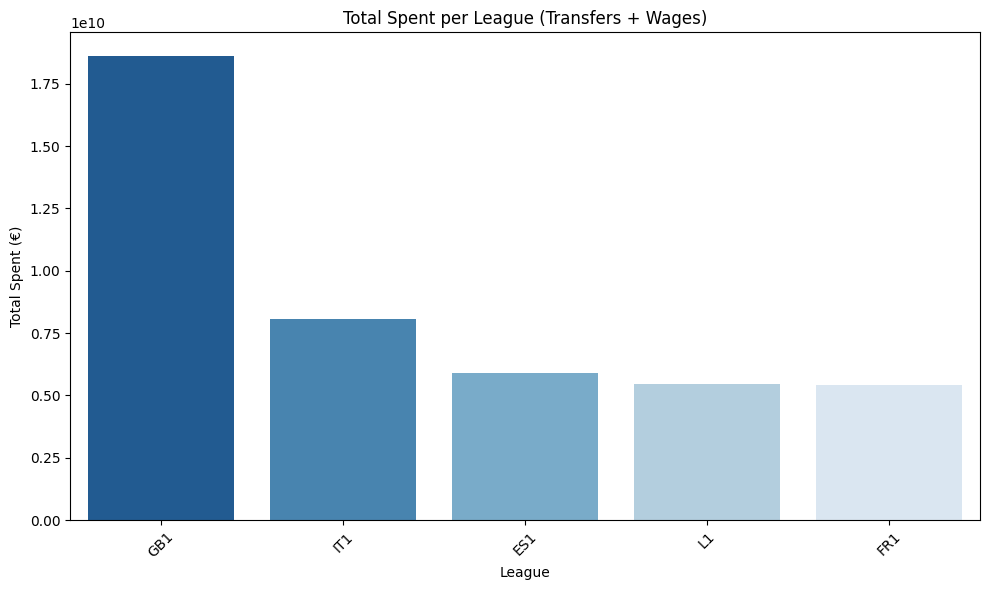

In [33]:
# Bar Chart: Total Spent per League
plt.figure(figsize=(10, 6))

league_spending = (
    return_on_performance_df
    .groupby("domestic_competition_id")["total_spent"]
    .sum()
    .sort_values(ascending=False)
)

sns.barplot(
    x=league_spending.index,
    y=league_spending.values,
    palette="Blues_r"
)

plt.title("Total Spent per League (Transfers + Wages)")
plt.xlabel("League")
plt.ylabel("Total Spent (€)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

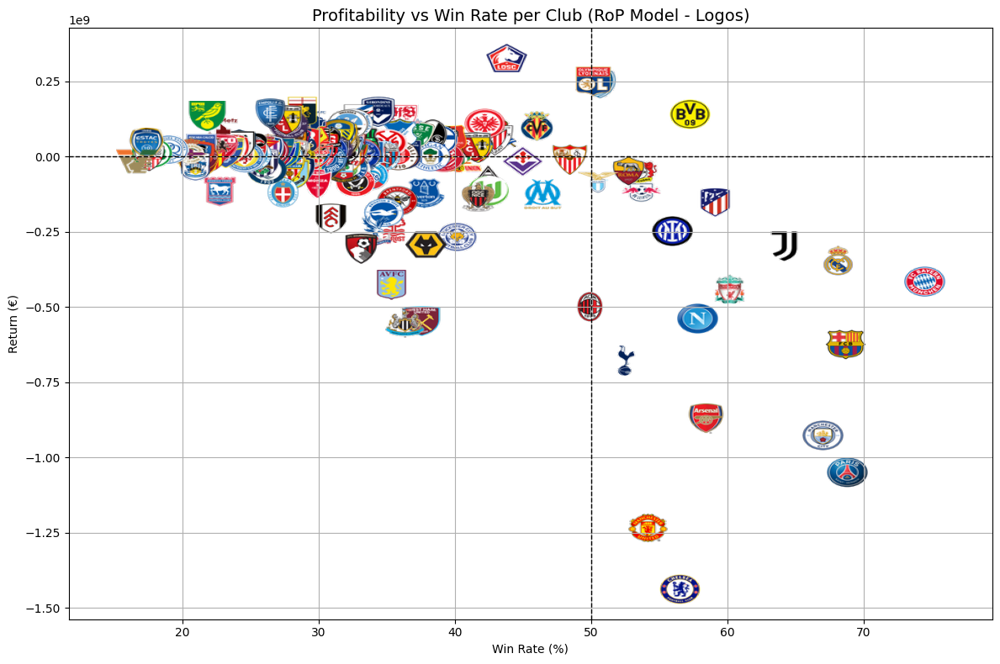

In [34]:
# Filter Valid Clubs
plot_df = return_on_performance_df.copy()
plot_df = plot_df[
    plot_df['club_name'].notna() &
    plot_df['club_logo_url'].notna()
]

# Create base figure
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title("Profitability vs Win Rate per Club (RoP Model - Logos)", fontsize=14)
ax.set_xlabel("Win Rate (%)")
ax.set_ylabel("Return (€)")
ax.grid(True)

# Set axis
x_margin = 5
y_margin = 1e8

ax.set_xlim(plot_df['win_rate'].min() - x_margin, plot_df['win_rate'].max() + x_margin)
ax.set_ylim(plot_df['return'].min() - y_margin, plot_df['return'].max() + y_margin)

# Draw reference line
ax.axhline(0, color='black', linestyle='--', linewidth=1)
ax.axvline(50, color='black', linestyle='--', linewidth=1)

# Insert Club Badges
for _, row in plot_df.iterrows():
    try:
        response = requests.get(row['club_logo_url'], timeout=10)
        img = Image.open(BytesIO(response.content)).convert("RGBA")
        img = img.resize((40, 40), Image.LANCZOS)

        x = row['win_rate']
        y = row['return']

        ax.imshow(
            img,
            extent=(
                x - 1.5, x + 1.5,
                y - 5e7, y + 5e7
            ),
            aspect='auto'
        )
    except Exception as e:
        print(f"Error with {row['club_name']}: {e}")

# Show
plt.tight_layout()
plt.show()

# 5. Pareto Efficient

In [35]:
# Prepare Main Dataframe
df = return_on_performance_df.copy()

# Base Scatter Plot (Gray Points + Red Zone + Black Dash Line)
fig = go.Figure()

# All clubs (gray scatter)
fig.add_trace(go.Scatter(
    x=df["win_rate"],
    y=df["return"],
    mode="markers",
    marker=dict(size=10, color="gray", opacity=0.55),
    text=df["club_name"],
    hovertemplate="<b>%{text}</b><br>Win Rate: %{x:.1f}%<br>Return: €%{y:,.0f}<extra></extra>",
    name="All Clubs"
))

# Black Dotted Frontier (original sliding frontier)
# Find the club with max return
max_idx = df['return'].idxmax()
max_point = df.loc[max_idx]

x_max = max_point['win_rate']
y_max = max_point['return']

# Constant frontier left of max
left_x = np.linspace(df['win_rate'].min(), x_max, 100)
left_y = np.full_like(left_x, y_max)

# Sliding window (right side)
right_df = df[df['win_rate'] > x_max].copy().sort_values(by='win_rate')

window_size = 40
step = 2
x_right = []
y_right = []

for start in np.arange(x_max, right_df['win_rate'].max(), step):
    end = start + window_size
    segment = right_df[(right_df['win_rate'] >= start) & (right_df['win_rate'] < end)]
    if not segment.empty:
        idx = segment['return'].idxmax()
        x_right.append(segment.loc[idx, 'win_rate'])
        y_right.append(segment.loc[idx, 'return'])

# Build dotted frontier curve
x_curve_black = np.concatenate([left_x, x_right])
y_curve_black = np.concatenate([left_y, y_right])

# Shade red inefficient area
y_min_data = float(df['return'].min())
y_floor = y_min_data - 0.05 * (df['return'].max() - y_min_data)

fig.add_trace(go.Scatter(
    x=x_curve_black,
    y=[y_floor]*len(x_curve_black),
    mode="lines",
    line=dict(width=0),
    showlegend=False,
    hoverinfo="skip"
))

fig.add_trace(go.Scatter(
    x=x_curve_black,
    y=y_curve_black,
    mode="lines",
    line=dict(color="black", width=2, dash="dot"),
    fill="tonexty",
    fillcolor="rgba(255,0,0,0.15)",
    name="Inefficient Region"
))


# Now add the true Pareto Frontier (Blue Line) + Green/Red Dots
pareto_df = df[['win_rate','return','club_name']].rename(columns={
    "club_name": "club_name"
}).dropna()

pareto_df = pareto_df.sort_values(by="win_rate", ascending=False)

# Compute Pareto frontier
pareto_points = []
max_return_seen = -np.inf

for _, row in pareto_df.iterrows():
    if row['return'] > max_return_seen:
        pareto_points.append(row)
        max_return_seen = row['return']

pareto_df = pd.DataFrame(pareto_points).sort_values(by="win_rate")

# Global efficient teams
max_win = pareto_df.loc[pareto_df['win_rate'].idxmax()]
max_return = pareto_df.loc[pareto_df['return'].idxmax()]

# Blue Line (True Pareto Frontier)
fig.add_trace(go.Scatter(
    x=pareto_df['win_rate'],
    y=pareto_df['return'],
    mode="lines+markers",
    line=dict(color="blue", width=3),
    marker=dict(size=10, color="blue"),
    text=pareto_df['club_name'],
    hovertemplate="<b>%{text}</b><br>Pareto Efficient<br>Win Rate: %{x:.1f}%<br>Return: €%{y:,.0f}<extra></extra>",
    name="Pareto Frontier"
))

# Green Dot (max win rate)
fig.add_trace(go.Scatter(
    x=[max_win['win_rate']], y=[max_win['return']],
    mode="markers+text",
    marker=dict(color="green", size=14),
    text=[max_win['club_name']],
    textposition="top center",
    name="Max Win Rate"
))

# Red Dot (max return)
fig.add_trace(go.Scatter(
    x=[max_return['win_rate']], y=[max_return['return']],
    mode="markers+text",
    marker=dict(color="red", size=14),
    text=[max_return['club_name']],
    textposition="top center",
    name="Max Return"
))

# Final Layout
fig.update_layout(
    template="plotly_white",
    title="Return vs Win Rate — Combined Graph (Frontier + Pareto)",
    xaxis_title="Win Rate (%)",
    yaxis_title="Return (€)",
    hovermode="closest",
    margin=dict(l=40, r=20, t=60, b=60),
)

fig.update_xaxes(tickformat=".0f")
fig.update_yaxes(tickformat=",.0f")
fig.show()

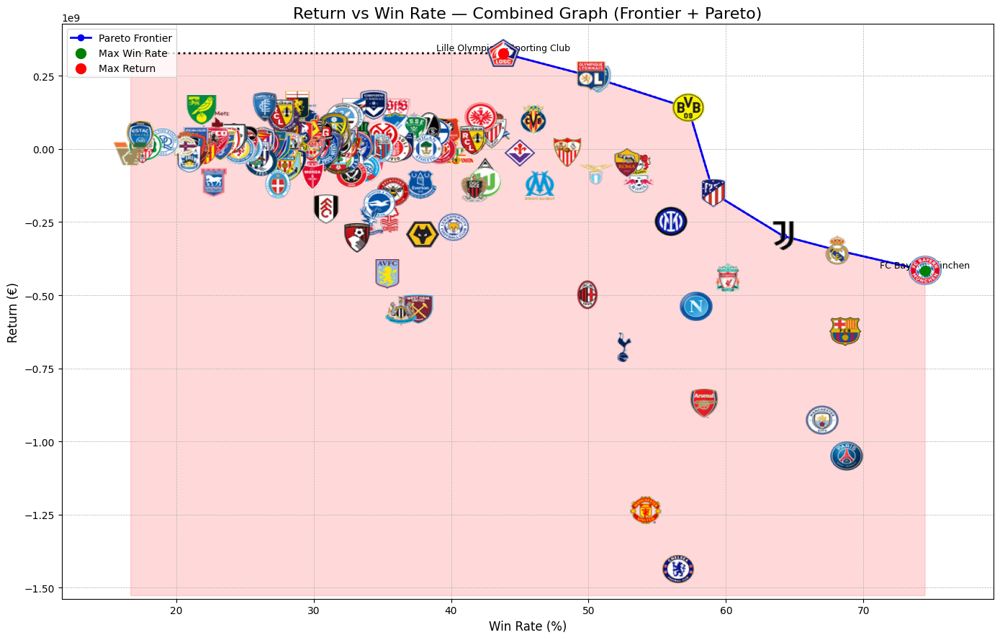

In [36]:
# Copy Data
df = return_on_performance_df.copy()
df = df[df['club_name'].notna() & df['club_logo_url'].notna()]

# Setup
fig, ax = plt.subplots(figsize=(14, 9))
ax.set_title("Return vs Win Rate — Combined Graph (Frontier + Pareto)", fontsize=16)
ax.set_xlabel("Win Rate (%)", fontsize=12)
ax.set_ylabel("Return (€)", fontsize=12)
ax.grid(True, linestyle='--', linewidth=0.5)

# Sliding Frontier (Black Dotted Line)
max_idx = df['return'].idxmax()
max_point = df.loc[max_idx]

x_max = max_point['win_rate']
y_max = max_point['return']

left_x = np.linspace(df['win_rate'].min(), x_max, 100)
left_y = np.full_like(left_x, y_max)

right_df = df[df['win_rate'] > x_max].copy().sort_values(by='win_rate')
window_size = 40
step = 2
x_right = []
y_right = []

for start in np.arange(x_max, right_df['win_rate'].max(), step):
    end = start + window_size
    segment = right_df[(right_df['win_rate'] >= start) & (right_df['win_rate'] < end)]
    if not segment.empty:
        idx = segment['return'].idxmax()
        x_right.append(segment.loc[idx, 'win_rate'])
        y_right.append(segment.loc[idx, 'return'])

x_curve_black = np.concatenate([left_x, x_right])
y_curve_black = np.concatenate([left_y, y_right])

# Red area under the curve
y_min_data = float(df['return'].min())
y_floor = y_min_data - 0.05 * (df['return'].max() - y_min_data)

ax.fill_between(x_curve_black, y_curve_black, y_floor, color='red', alpha=0.15)
ax.plot(x_curve_black, y_curve_black, color='black', linestyle='dotted', linewidth=2)

# Pareto Frontier (Blue Line)
pareto_df = df[['win_rate','return','club_name']].copy().dropna()
pareto_df = pareto_df.sort_values(by="win_rate", ascending=False)

pareto_points = []
max_return_seen = -np.inf

for _, row in pareto_df.iterrows():
    if row['return'] > max_return_seen:
        pareto_points.append(row)
        max_return_seen = row['return']

pareto_df = pd.DataFrame(pareto_points).sort_values(by="win_rate")

ax.plot(pareto_df['win_rate'], pareto_df['return'], color='blue', linewidth=2, marker='o', label='Pareto Frontier')

# Markers for Max Points
max_win = pareto_df.loc[pareto_df['win_rate'].idxmax()]
max_ret = pareto_df.loc[pareto_df['return'].idxmax()]

ax.scatter(max_win['win_rate'], max_win['return'], color='green', s=100, zorder=5, label='Max Win Rate')
ax.text(max_win['win_rate'], max_win['return'] + 1e7, max_win['club_name'], ha='center', fontsize=9)

ax.scatter(max_ret['win_rate'], max_ret['return'], color='red', s=100, zorder=5, label='Max Return')
ax.text(max_ret['win_rate'], max_ret['return'] + 1e7, max_ret['club_name'], ha='center', fontsize=9)

# Club Badges
def get_image_from_url(url):
    try:
        response = requests.get(url, timeout=10)
        img = Image.open(BytesIO(response.content)).convert("RGBA")
        img = img.resize((35, 35), Image.LANCZOS)
        return img
    except:
        return None

for _, row in df.iterrows():
    x = row['win_rate']
    y = row['return']
    img = get_image_from_url(row['club_logo_url'])
    if img:
        ax.imshow(img, extent=(
            x - 1.2, x + 1.2,
            y - 5e7, y + 5e7
        ), aspect='auto', zorder=4)

# Axis
x_margin = 5
y_margin = 1e8
ax.set_xlim(df['win_rate'].min() - x_margin, df['win_rate'].max() + x_margin)
ax.set_ylim(df['return'].min() - y_margin, df['return'].max() + y_margin)
ax.legend(loc="upper left")

# Plot
plt.tight_layout()
plt.show()

In [37]:
# Report Pareto-Efficient vs Inefficient Clubs
# All clubs (unique by name)
all_clubs = df["club_name"].dropna().unique()

# Pareto-efficient clubs (from your pareto_df)
efficient_clubs = pareto_df["club_name"].unique()

# Inefficient clubs
inefficient_clubs = [c for c in all_clubs if c not in efficient_clubs]

num_total = len(all_clubs)
num_efficient = len(efficient_clubs)
num_inefficient = len(inefficient_clubs)

pct_efficient = 100 * num_efficient / num_total
pct_inefficient = 100 * num_inefficient / num_total

print("\n================ PARETO EFFICIENCY SUMMARY ================")

print(f"Total clubs analysed: {num_total}")
print(f"Efficient clubs: {num_efficient} ({pct_efficient:.2f}%)")
print(f"Inefficient clubs: {num_inefficient} ({pct_inefficient:.2f}%)\n")

print("===== PARETO-EFFICIENT CLUBS =====")
for c in efficient_clubs:
    print("-", c)

print("\n===== INEFFICIENT CLUBS =====")
for c in inefficient_clubs:
    print("-", c)


================ PARETO EFFICIENCY SUMMARY ================
Total clubs analysed: 173
Efficient clubs: 8 (4.62%)
Inefficient clubs: 165 (95.38%)

===== PARETO-EFFICIENT CLUBS =====
- Lille Olympique Sporting Club
- Olympique Lyonnais
- Association sportive de Monaco Football Club
- Borussia Dortmund
- Club Atlético de Madrid S.A.D.
- Juventus Football Club
- Real Madrid Club de Fútbol
- FC Bayern München

===== INEFFICIENT CLUBS =====
- Paris Saint-Germain Football Club
- Futbol Club Barcelona
- Manchester City Football Club
- Liverpool Football Club
- Arsenal Football Club
- Società Sportiva Calcio Napoli
- Chelsea Football Club
- Football Club Internazionale Milano S.p.A.
- Manchester United Football Club
- RasenBallsport Leipzig
- Bayer 04 Leverkusen Fußball
- Associazione Sportiva Roma
- Tottenham Hotspur Football Club
- Società Sportiva Lazio S.p.A.
- Associazione Calcio Milan
- Sevilla Fútbol Club S.A.D.
- Olympique de Marseille
- Atalanta Bergamasca Calcio S.p.a.
- Villarreal C

In [38]:
correlation_results = {}

# Overall Correlations
overall_corr = {
    "win_vs_total_spending": return_on_performance_df["win_rate"].corr(return_on_performance_df["total_spent"]),
    "win_vs_wages": return_on_performance_df["win_rate"].corr(return_on_performance_df["total_spent_wages"]),
    "win_vs_transfer_fees": return_on_performance_df["win_rate"].corr(return_on_performance_df["total_spent_transfer_fees"])
}

correlation_results["OVERALL"] = overall_corr

# Per-League Correlations
leagues = return_on_performance_df["domestic_competition_id"].unique()

for lg in leagues:
    sub = return_on_performance_df[return_on_performance_df["domestic_competition_id"] == lg]

    correlation_results[lg] = {
        "win_vs_total_spending": sub["win_rate"].corr(sub["total_spent"]),
        "win_vs_wages": sub["win_rate"].corr(sub["total_spent_wages"]),
        "win_vs_transfer_fees": sub["win_rate"].corr(sub["total_spent_transfer_fees"])
    }

# Convert dict → DataFrame
corr_df = pd.DataFrame.from_dict(correlation_results, orient='index')

# Optional: Sort by league name
corr_df = corr_df.reset_index().rename(columns={'index': 'league'})

# Show table
print(corr_df.to_string(index=False))

 league  win_vs_total_spending  win_vs_wages  win_vs_transfer_fees
OVERALL               0.800351      0.824710              0.797954
     L1               0.910699      0.884716              0.909158
    FR1               0.890456      0.804816              0.889565
    ES1               0.927277      0.858392              0.926511
    GB1               0.849889      0.896144              0.848064
    IT1               0.902873      0.907450              0.901880


### 5.1. Pareto by League

In [39]:
#  FILTER DATASET FOR TOP 5 LEAGUES
top5 = ["GB1", "ES1", "IT1", "L1", "FR1"]

df_base = return_on_performance_df.copy()
df_base = df_base[df_base["domestic_competition_id"].isin(top5)]

#  LOOP THROUGH EACH LEAGUE AND GENERATE GRAPH
for league in top5:
    df = df_base[df_base["domestic_competition_id"] == league].copy()

    if df.empty:
        print(f"⚠ No data for {league}")
        continue

    # BASE FIGURE (GRAY POINTS)
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=df["win_rate"],
        y=df["return"],
        mode="markers",
        marker=dict(size=10, color="gray", opacity=0.55),
        text=df["club_name"],
        hovertemplate="<b>%{text}</b><br>Win Rate: %{x:.1f}%<br>Return: €%{y:,.0f}<extra></extra>",
        name="All Clubs"
    ))

    # REFERENCE LINES
    fig.add_hline(y=0, line_color='black', line_width=1, line_dash='dash')
    fig.add_vline(x=50, line_color='black', line_width=1, line_dash='dash')

    # DOTTED BLACK FRONTIER (original curve)
    max_idx = df['return'].idxmax()
    max_point = df.loc[max_idx]

    x_max = max_point['win_rate']
    y_max = max_point['return']

    # Left part: constant max return
    left_x = np.linspace(df['win_rate'].min(), x_max, 100)
    left_y = np.full_like(left_x, y_max)

    # Right part: sliding window
    right_df = df[df['win_rate'] > x_max].sort_values(by='win_rate')
    window_size = 40
    step = 2

    x_right = []
    y_right = []

    for start in np.arange(x_max, right_df['win_rate'].max(), step):
        end = start + window_size
        segment = right_df[(right_df['win_rate'] >= start) & (right_df['win_rate'] < end)]
        if not segment.empty:
            idx = segment['return'].idxmax()
            x_right.append(segment.loc[idx, 'win_rate'])
            y_right.append(segment.loc[idx, 'return'])

    x_curve_black = np.concatenate([left_x, x_right])
    y_curve_black = np.concatenate([left_y, y_right])

    # Red shading
    y_min_data = float(df['return'].min())
    y_floor = y_min_data - 0.05 * (df['return'].max() - y_min_data)

    fig.add_trace(
        go.Scatter(
            x=x_curve_black,
            y=[y_floor] * len(x_curve_black),
            mode="lines",
            line=dict(width=0),
            showlegend=False,
            hoverinfo="skip"
        )
    )

    fig.add_trace(
        go.Scatter(
            x=x_curve_black,
            y=y_curve_black,
            mode="lines",
            line=dict(color="black", width=2, dash="dot"),
            fill="tonexty",
            fillcolor="rgba(255,0,0,0.15)",
            name="Inefficient Region"
        )
    )

    # TRUE PARETO FRONTIER (BLUE LINE)
    pareto_df = df[['win_rate','return','club_name']].rename(
        columns={"club_name_financial": "club_name"}
    ).dropna()

    pareto_df = pareto_df.sort_values(by="win_rate", ascending=False)

    pareto_points = []
    max_ret_seen = -np.inf

    for _, row in pareto_df.iterrows():
        if row['return'] > max_ret_seen:
            pareto_points.append(row)
            max_ret_seen = row['return']

    pareto_df = pd.DataFrame(pareto_points).sort_values(by="win_rate")

    # Global efficient teams
    max_win = pareto_df.loc[pareto_df['win_rate'].idxmax()]
    max_return = pareto_df.loc[pareto_df['return'].idxmax()]

    # Blue Pareto line
    fig.add_trace(go.Scatter(
        x=pareto_df["win_rate"],
        y=pareto_df["return"],
        mode="lines+markers",
        line=dict(color="blue", width=3),
        marker=dict(size=10, color="blue"),
        text=pareto_df["club_name"],
        hovertemplate="<b>%{text}</b><br>Pareto Efficient<br>Win Rate: %{x:.1f}%<br>Return: €%{y:,.0f}<extra></extra>",
        name="Pareto Frontier"
    ))

    # Max win-rate (green)
    fig.add_trace(go.Scatter(
        x=[max_win["win_rate"]],
        y=[max_win["return"]],
        mode="markers+text",
        marker=dict(size=14, color="green"),
        text=[max_win["club_name"]],
        textposition="top center",
        name="Max Win Rate"
    ))

    # Max return (red)
    fig.add_trace(go.Scatter(
        x=[max_return["win_rate"]],
        y=[max_return["return"]],
        mode="markers+text",
        marker=dict(size=14, color="red"),
        text=[max_return["club_name"]],
        textposition="top center",
        name="Max Return"
    ))

    # LAYOUT
    fig.update_layout(
        template="plotly_white",
        title=f"Return vs Win Rate — Pareto Frontier ({league})",
        xaxis_title="Win Rate (%)",
        yaxis_title="Return (€)",
        hovermode="closest",
        margin=dict(l=40, r=20, t=60, b=60),
    )

    fig.update_xaxes(tickformat=".0f")
    fig.update_yaxes(tickformat=",.0f")
    fig.show()

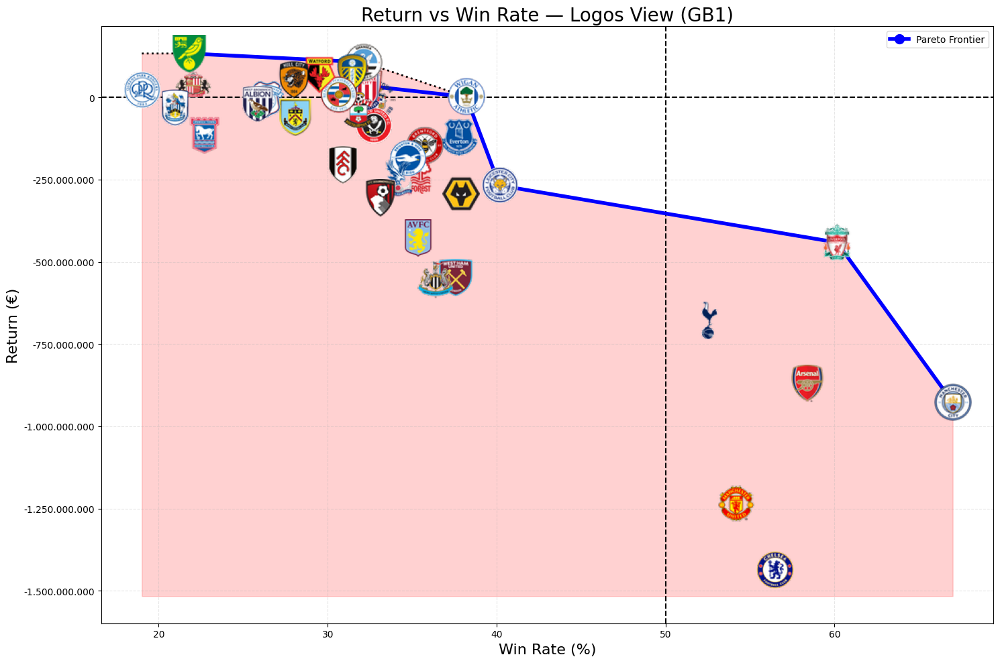

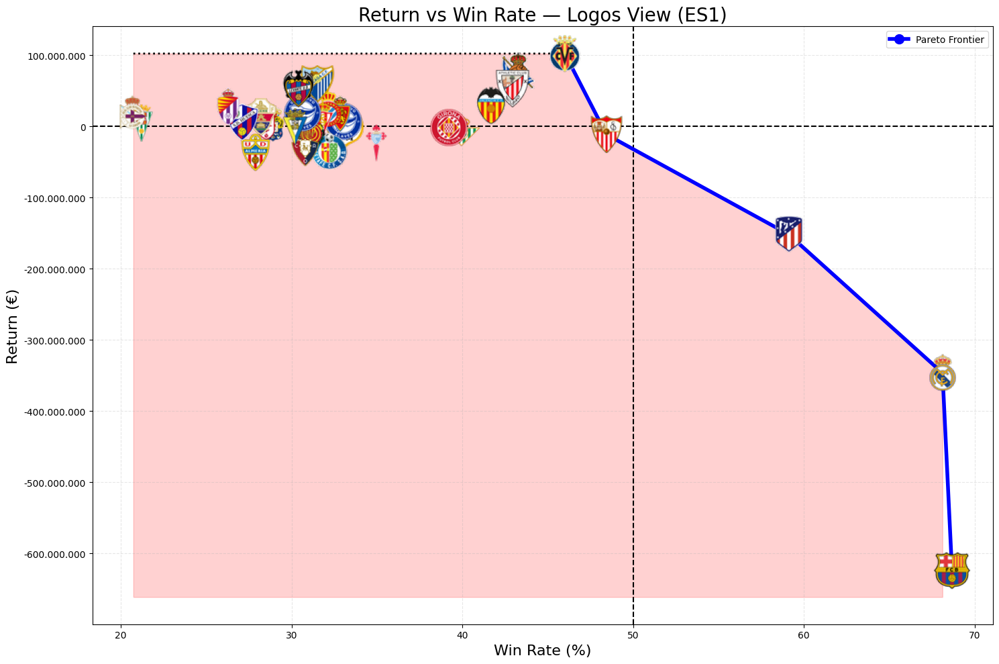

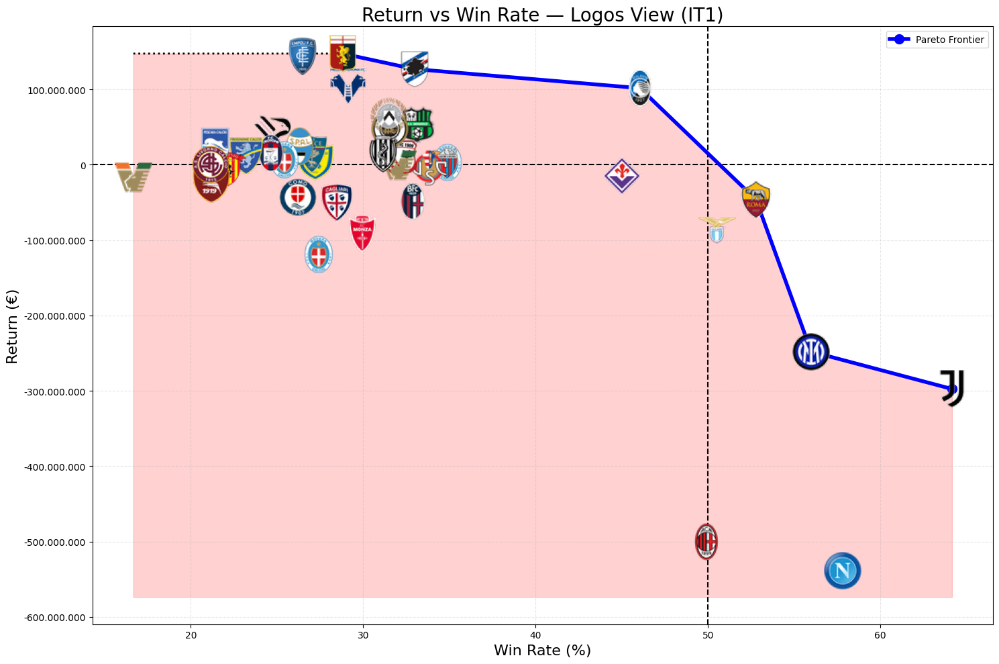

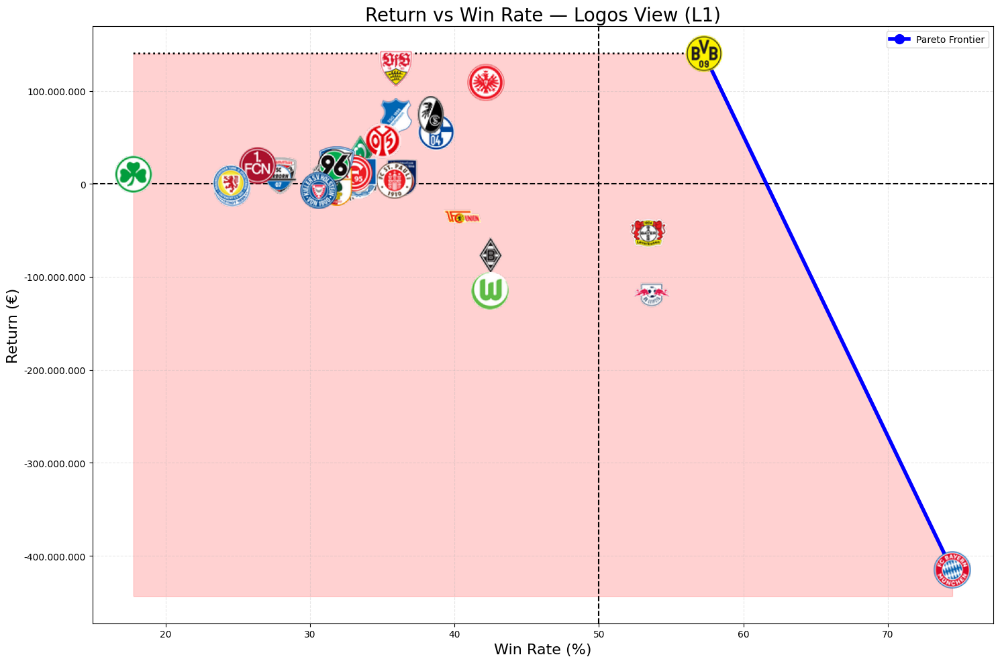

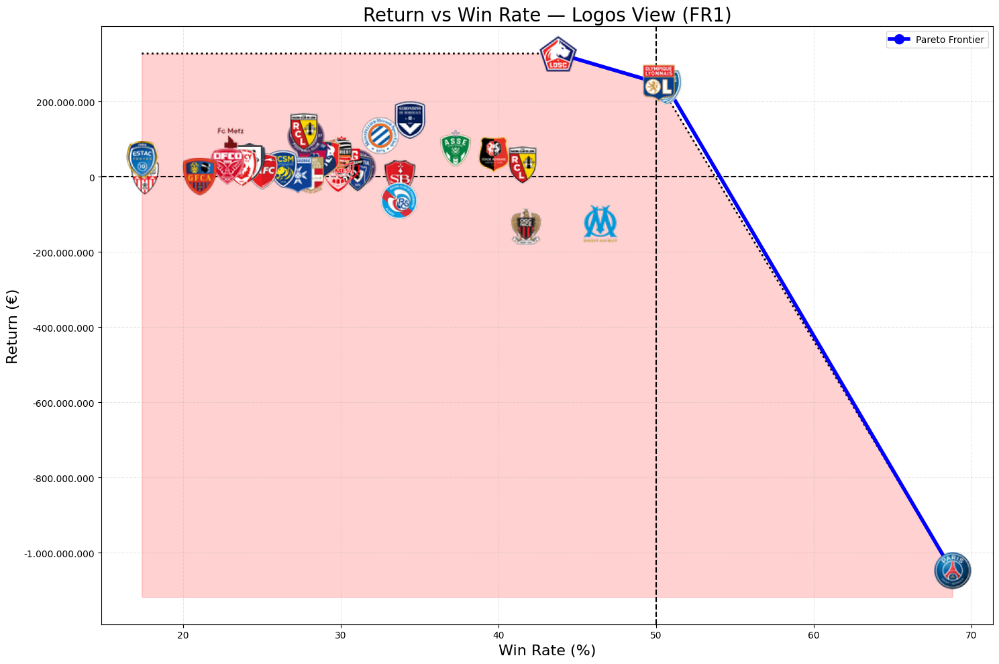

In [40]:
# FUNCTION: LOAD LOGO FROM URL — REAL RESIZE (NOT ONLY ZOOM)
def get_logo_image(url):
    try:
        response = requests.get(url, timeout=5)
        img = Image.open(BytesIO(response.content)).convert("RGBA")

        # *** REAL SIZE BOOST HERE ***
        img = img.resize((40, 40), Image.LANCZOS)

        return OffsetImage(img, zoom=1.0)  # zoom stays fixed
    except:
        return None

# FORMATTER FOR Y AXIS (NO SCIENTIFIC NOTATION)
def thousands_formatter(x, pos):
    return f"{int(x):,}".replace(",", ".")

#  FILTER DATASET FOR TOP 5 LEAGUES
top5 = ["GB1", "ES1", "IT1", "L1", "FR1"]

df_base = return_on_performance_df.copy()
df_base = df_base[df_base["domestic_competition_id"].isin(top5)]

#  LOOP THROUGH LEAGUES
for league in top5:
    df = df_base[df_base["domestic_competition_id"] == league].copy()

    if df.empty:
        print(f"⚠ No data for {league}")
        continue

    fig, ax = plt.subplots(figsize=(15, 10))

    # REFERENCE LINES
    ax.axhline(0, linestyle="--", color="black")
    ax.axvline(50, linestyle="--", color="black")

    # ORIGINAL BLACK FRONTIER
    max_idx = df['return'].idxmax()
    max_point = df.loc[max_idx]

    x_max = max_point['win_rate']
    y_max = max_point['return']

    left_x = np.linspace(df['win_rate'].min(), x_max, 100)
    left_y = np.full_like(left_x, y_max)

    right_df = df[df['win_rate'] > x_max].sort_values(by="win_rate")
    window_size = 40
    step = 2

    x_right, y_right = [], []

    for start in np.arange(x_max, right_df['win_rate'].max(), step):
        end = start + window_size
        seg = right_df[(right_df["win_rate"] >= start) &
                       (right_df["win_rate"] < end)]
        if not seg.empty:
            best = seg.loc[seg['return'].idxmax()]
            x_right.append(best["win_rate"])
            y_right.append(best["return"])

    x_curve_black = np.concatenate([left_x, x_right])
    y_curve_black = np.concatenate([left_y, y_right])

    # RED INEFFICIENT REGION
    y_min = float(df['return'].min())
    y_floor = y_min - 0.05 * (df['return'].max() - y_min)

    ax.fill_between(
        x_curve_black, y_curve_black, y_floor,
        color=(1, 0, 0, 0.18)
    )

    ax.plot(x_curve_black, y_curve_black, linestyle=":", color="black", linewidth=2)

    # PARETO FRONTIER (BLUE)
    pareto_df = df[['win_rate','return','club_name','club_logo_url']].dropna()
    pareto_df = pareto_df.sort_values(by="win_rate", ascending=False)

    pts = []
    seen = -np.inf
    for _, row in pareto_df.iterrows():
        if row["return"] > seen:
            pts.append(row)
            seen = row["return"]

    pareto_df = pd.DataFrame(pts).sort_values(by="win_rate")

    ax.plot(
        pareto_df["win_rate"],
        pareto_df["return"],
        "-o",
        linewidth=4,
        markersize=10,
        color="blue",
        label="Pareto Frontier"
    )


    # ===========================
    # CLUB LOGOS — FIXED BIG SIZE
    # ===========================
    for _, row in df.iterrows():
        img = get_logo_image(row['club_logo_url'])
        if img:
            ab = AnnotationBbox(
                img,
                (row["win_rate"], row["return"]),
                frameon=False,
                box_alignment=(0.5, 0.5)
            )
            ax.add_artist(ab)

    # Y AXIS FULL FORMAT
    ax.ticklabel_format(style='plain', axis='y')
    ax.yaxis.set_major_formatter(FuncFormatter(thousands_formatter))

    # LAYOUT
    ax.set_title(f"Return vs Win Rate — Logos View ({league})", fontsize=20)
    ax.set_xlabel("Win Rate (%)", fontsize=16)
    ax.set_ylabel("Return (€)", fontsize=16)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.legend()
    plt.tight_layout()

    plt.show()

# 6. Efficient Frontier

In [41]:
# Prepare data
df = return_on_performance_df.copy()
df = df.dropna(subset=["win_rate", "return", "club_name"])

# Punto A: máxima rentabilidad
A_point = df.loc[df["return"].idxmax()]
W_A, R_A = float(A_point["win_rate"]), float(A_point["return"])

# Punto B: máximo win rate
B_point = df.loc[df["win_rate"].idxmax()]
W_B, R_B = float(B_point["win_rate"]), float(B_point["return"])

print("Max Return:", A_point["club_name"], W_A, R_A)
print("Max WinRate:", B_point["club_name"], W_B, R_B)

# Define R(W) = A - B * exp(γ W)
gamma = 0.05 

# Calculate B
den = np.exp(gamma * W_B) - np.exp(gamma * W_A)
B = (R_A - R_B) / den

# Calculate A
A_param = R_A + B * np.exp(gamma * W_A)

print("A_param:", A_param)
print("B:", B)
print("gamma:", gamma)

# Generate curve
x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 400)
y_curve = A_param - B * np.exp(gamma * x_curve)

# Check
print("R(W_A) curve:", A_param - B * np.exp(gamma * W_A))
print("R(W_B) curve:", A_param - B * np.exp(gamma * W_B))

# Scatter base
fig = px.scatter(
    df,
    x="win_rate",
    y="return",
    hover_name="club_name",
    hover_data={"win_rate":":.1f", "return":":,.0f"},
    title="RoP Frontier Model — Exponential Efficient Frontier"
)

fig.update_traces(
    marker=dict(size=10, color="#777", opacity=0.8,
                line=dict(width=0.6, color="white")),
    selector=dict(mode="markers")
)

# Frontier Curve
fig.add_trace(go.Scatter(
    x=x_curve,
    y=y_curve,
    mode="lines",
    line=dict(color="blue", width=4),
    name="Efficient Frontier (Exponential, concave)"
))

# Point A: Max Return (red)
fig.add_trace(go.Scatter(
    x=[W_A], y=[R_A],
    mode="markers+text",
    text=[A_point["club_name"]],
    textposition="top center",
    marker=dict(size=14, color="red"),
    name="Max Return"
))

# Point B: Max Win Rate (green)
fig.add_trace(go.Scatter(
    x=[W_B], y=[R_B],
    mode="markers+text",
    text=[B_point["club_name"]],
    textposition="bottom center",
    marker=dict(size=14, color="green"),
    name="Max Win Rate"
))

# Reference liens (optional)
fig.add_hline(y=0, line_color='black', line_width=1, line_dash='dash')
fig.add_vline(x=50, line_color='black', line_width=1, line_dash='dash')

fig.update_layout(
    template="plotly_white",
    xaxis_title="Win Rate (%)",
    yaxis_title="Return (€)",
    hovermode="closest",
    showlegend=True
)

fig.update_xaxes(tickformat=".0f")
fig.update_yaxes(tickformat=",.0f")

# Red Area — INEFFICIENT REGION (Below frontier)
y_min_data = float(df["return"].min())
y_floor = y_min_data - 0.05 * (df["return"].max() - y_min_data)

# Lower line
fig.add_trace(go.Scatter(
    x=x_curve,
    y=[y_floor] * len(x_curve),
    mode="lines",
    line=dict(width=0),
    hoverinfo="skip",
    showlegend=False
))

# Red fill
fig.add_trace(go.Scatter(
    x=x_curve,
    y=y_curve,
    mode="lines",
    line=dict(width=0),
    fill="tonexty",
    fillcolor="rgba(255, 0, 0, 0.15)",
    hoverinfo="skip",
    showlegend=False
))

fig.show()

Max Return: Lille Olympique Sporting Club 43.7847866419295 327177950.0
Max WinRate: FC Bayern München 74.46808510638297 -415500000.0
A_param: 531353316.727857
B: 22868031.55533005
gamma: 0.05
R(W_A) curve: 327177950.0
R(W_B) curve: -415500000.0000001


In [42]:
# Copy df
eff_df = return_on_performance_df.copy()
eff_df = eff_df.dropna(subset=["win_rate", "return"])

# Compute expected frontier return for each win_rate
#     R_frontier(W) = A - B * exp(gamma * W)
eff_df["frontier_return"] = A_param - B * np.exp(gamma * eff_df["win_rate"])

# Distance to efficiency (in millions)
# Raw difference: how much MORE money needed to reach the efficient frontier
eff_df["raw_distance"] = eff_df["frontier_return"] - eff_df["return"]

# Negative values mean the club is above the frontier → set to 0
eff_df["raw_distance"] = eff_df["raw_distance"].clip(lower=0)

# Convert to millions
eff_df["millions_to_efficiency"] = eff_df["raw_distance"] / 1_000_000

# Normalized distance (0–1)
min_d = eff_df["millions_to_efficiency"].min()
max_d = eff_df["millions_to_efficiency"].max()

eff_df["normalized_distance"] = (eff_df["millions_to_efficiency"] - min_d) / (max_d - min_d)

eff_df["yearly_millions_to_efficiency"] = eff_df["millions_to_efficiency"] / 8

# Final dataset
distance_to_efficiency_df = eff_df[
    [
        "club_id",
        "club_name",
        "win_rate",
        "return",
        "frontier_return",
        "millions_to_efficiency",
        "normalized_distance",
        "yearly_millions_to_efficiency"
    ]
].copy()

# Yearly distance (divide by 8 seasons)
distance_to_efficiency_df.head()

,club_id,club_name,win_rate,return,frontier_return,millions_to_efficiency,normalized_distance,yearly_millions_to_efficiency
0,27.0,FC Bayern München,74.468085,-4.155000e+08,-4.155000e+08,0.000000,0.000000,0.000000
1,583.0,Paris Saint-Germain Football Club,68.801314,-1.049167e+09,-1.818779e+08,867.289179,0.547686,108.411147
2,131.0,Futbol Club Barcelona,68.673051,-6.251630e+08,-1.773184e+08,447.844552,0.282810,55.980569
3,418.0,Real Madrid Club de Fútbol,68.113976,-3.466000e+08,-1.577827e+08,188.817266,0.119237,23.602158
4,281.0,Manchester City Football Club,67.002882,-9.270293e+08,-1.205420e+08,806.487278,0.509290,100.810910


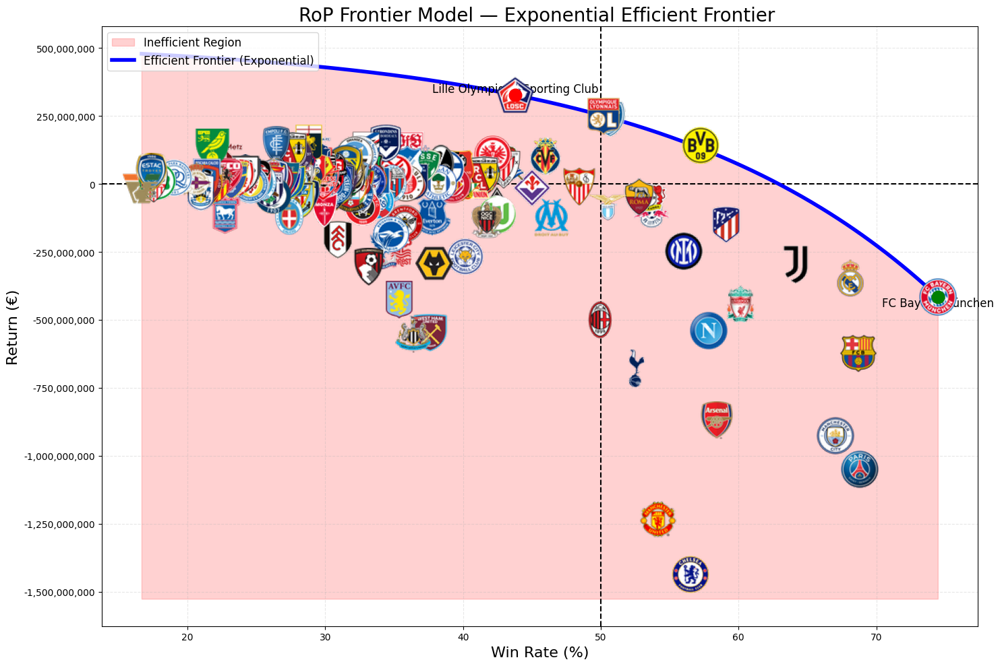

In [43]:
# FUNCTION: LOAD LOGO AS 40×40 px
def load_logo(url, size=(40, 40)):
    try:
        resp = requests.get(url, timeout=5)
        img = Image.open(BytesIO(resp.content)).convert("RGBA")
        img = img.resize(size, Image.LANCZOS)
        return img
    except:
        return None

# PREPARE DATA
df = return_on_performance_df.copy()
df = df.dropna(subset=["win_rate", "return", "club_name", "club_logo_url"])

# Point A – Max return
A_point = df.loc[df["return"].idxmax()]
W_A, R_A = float(A_point["win_rate"]), float(A_point["return"])

# Point B – Max win rate
B_point = df.loc[df["win_rate"].idxmax()]
W_B, R_B = float(B_point["win_rate"]), float(B_point["return"])

# EXPONENTIAL MODEL: R(W) = A - B * exp(γW)
gamma = 0.05

den = np.exp(gamma * W_B) - np.exp(gamma * W_A)
B = (R_A - R_B) / den
A_param = R_A + B * np.exp(gamma * W_A)

# Generate curve
x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 400)
y_curve = A_param - B * np.exp(gamma * x_curve)

# CREATE FIGURE
plt.figure(figsize=(15, 10))
ax = plt.gca()

# Reference lines
ax.axhline(0, linestyle="--", color="black")
ax.axvline(50, linestyle="--", color="black")

# SHADED RED INEFFICIENT REGION
y_min_data = float(df["return"].min())
y_floor = y_min_data - 0.05 * (df["return"].max() - y_min_data)

ax.fill_between(
    x_curve,
    y_curve,
    y_floor,
    color=(1, 0, 0, 0.18),
    label="Inefficient Region"
)

# EXPONENTIAL FRONTIER (BLUE)
ax.plot(
    x_curve,
    y_curve,
    color="blue",
    linewidth=4,
    label="Efficient Frontier (Exponential)"
)

# POINTS A (MAX RETURN) AND B (MAX WIN RATE)
# A — Max Return
ax.scatter(W_A, R_A, s=180, c="red", zorder=4)
ax.text(W_A, R_A, A_point["club_name"], fontsize=12, ha="center", va="bottom")

# B — Max Win Rate
ax.scatter(W_B, R_B, s=180, c="green", zorder=4)
ax.text(W_B, R_B, B_point["club_name"], fontsize=12, ha="center", va="top")

# CLUB LOGOS
for _, row in df.iterrows():
    logo_img = load_logo(row["club_logo_url"], size=(40, 40))
    if logo_img:
        imagebox = OffsetImage(logo_img, zoom=1.0)
        ab = AnnotationBbox(
            imagebox,
            (row["win_rate"], row["return"]),
            frameon=False,
            pad=0.2
        )
        ax.add_artist(ab)


# AXIS STYLE (NO SCIENTIFIC NOTATION)
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:,.0f}"))
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.0f}"))

# TITLES & LAYOUT
ax.set_title("RoP Frontier Model — Exponential Efficient Frontier ", fontsize=20)
ax.set_xlabel("Win Rate (%)", fontsize=16)
ax.set_ylabel("Return (€)", fontsize=16)

ax.legend(loc="upper left", fontsize=12)
ax.grid(True, linestyle="--", alpha=0.3)

plt.tight_layout()
plt.show()

### 6.1. Divisions by League

In [44]:
# Prepare df
df = return_on_performance_df.copy()
df = df.dropna(subset=["win_rate", "return", "club_name"]).copy()

# Calculate Pareto Efficient Points (Max Return Given Win Rate)
pareto_df = df[["win_rate", "return", "club_name"]].copy()
pareto_df = pareto_df.sort_values(by="win_rate", ascending=False)

pareto_points = []
max_return_seen = -np.inf

for _, row in pareto_df.iterrows():
    if row["return"] > max_return_seen:
        pareto_points.append(row)
        max_return_seen = row["return"]

pareto_df = pd.DataFrame(pareto_points).sort_values(by="win_rate")

# Global points
max_ret_point = pareto_df.loc[pareto_df["return"].idxmax()]
max_win_point = pareto_df.loc[pareto_df["win_rate"].idxmax()]

W_A, R_A = float(max_ret_point["win_rate"]), float(max_ret_point["return"])
W_B, R_B = float(max_win_point["win_rate"]), float(max_win_point["return"])

# R(W) = A - B * exp(gamma * W)
gamma = 0.05 

den = np.exp(gamma * W_B) - np.exp(gamma * W_A)
B = (R_A - R_B) / den
A_param = R_A + B * np.exp(gamma * W_A)

# Adjust Frontier to be above Pareto
W_p = pareto_df["win_rate"].values
R_p = pareto_df["return"].values

R_curve_p = A_param - B * np.exp(gamma * W_p)
shift = max(0, (R_p - R_curve_p).max())

A_param_shifted = A_param + shift

# Final curve
x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 300)
y_curve = A_param_shifted - B * np.exp(gamma * x_curve)

# Graphic
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df["win_rate"], y=df["return"],
    mode="markers",
    marker=dict(size=10, color="gray", opacity=0.55),
    text=df["club_name"],
    hovertemplate="<b>%{text}</b><br>Win Rate: %{x:.1f}%<br>Return: €%{y:,.0f}<extra></extra>",
    name="All Clubs"
))

fig.add_trace(go.Scatter(
    x=x_curve,
    y=y_curve,
    mode="lines",
    line=dict(color="blue", width=4),
    name="Efficient Frontier (Exponential)"
))

fig.add_trace(go.Scatter(
    x=[W_A], y=[R_A],
    mode="markers+text",
    marker=dict(size=14, color="red"),
    text=[max_ret_point["club_name"]],
    textposition="top center",
    name="Max Return"
))

fig.add_trace(go.Scatter(
    x=[W_B], y=[R_B],
    mode="markers+text",
    marker=dict(size=14, color="green"),
    text=[max_win_point["club_name"]],
    textposition="bottom center",
    name="Max Win Rate"
))

y_min = df["return"].min() - 0.05 * (df["return"].max() - df["return"].min())

fig.add_trace(go.Scatter(
    x=x_curve,
    y=[y_min] * len(x_curve),
    mode="lines",
    line=dict(width=0),
    hoverinfo="skip",
    showlegend=False
))

fig.add_trace(go.Scatter(
    x=x_curve,
    y=y_curve,
    mode="lines",
    fill="tonexty",
    fillcolor="rgba(255,0,0,0.15)",
    line=dict(width=0),
    hoverinfo="skip",
    showlegend=False
))

fig.update_layout(
    title="Efficient Frontier — Global Exponential Model (Pareto-Safe)",
    template="plotly_white",
    xaxis_title="Win Rate (%)",
    yaxis_title="Return (€)",
    hovermode="closest",
    margin=dict(l=40, r=40, t=80, b=40)
)

fig.update_xaxes(tickformat=".0f")
fig.update_yaxes(tickformat=",.0f")
fig.show()

### 6.2. Distances to Efficiency

In [45]:
# Copy df
eff_df = return_on_performance_df.copy()
eff_df = eff_df.dropna(subset=["win_rate", "return"]).copy()

# R_frontier(W) = A_shifted - B * exp(gamma * W)
eff_df["frontier_return"] = A_param_shifted - B * np.exp(gamma * eff_df["win_rate"])

# Distance (in EUR) to the efficient Frontier
eff_df["raw_distance"] = eff_df["frontier_return"] - eff_df["return"]
eff_df["raw_distance"] = eff_df["raw_distance"].clip(lower=0)
eff_df["millions_to_efficiency"] = eff_df["raw_distance"] / 1_000_000

# Distance yearly (divided by 8 seasons)
eff_df["yearly_millions_to_efficiency"] = eff_df["millions_to_efficiency"] / 8

# Normalize distance (0–1)
dmin = eff_df["millions_to_efficiency"].min()
dmax = eff_df["millions_to_efficiency"].max()

eff_df["normalized_distance"] = (eff_df["millions_to_efficiency"] - dmin) / (dmax - dmin)

# Final DataFrame
distance_to_efficiency_df = eff_df[
    [
        "club_id",
        "club_name",
        "domestic_competition_id",
        "win_rate",
        "return",
        "frontier_return",
        "millions_to_efficiency",
        "yearly_millions_to_efficiency",
        "normalized_distance", 
        "club_logo_url"
    ]
].sort_values(by="millions_to_efficiency", ascending=False).reset_index(drop=True)

In [46]:
df_eff = distance_to_efficiency_df.copy()

# Create yearly column if not already present
df_eff["yearly_millions_to_efficiency"] = df_eff["millions_to_efficiency"] / 8

# OVERALL AVERAGES
overall_avg = df_eff["millions_to_efficiency"].mean()
overall_avg_yearly = df_eff["yearly_millions_to_efficiency"].mean()

# AVERAGE PER LEAGUE (TOTAL & YEARLY)
avg_per_league = (
    df_eff.groupby("domestic_competition_id")["millions_to_efficiency"]
    .mean()
    .reset_index()
)

avg_per_league_yearly = (
    df_eff.groupby("domestic_competition_id")["yearly_millions_to_efficiency"]
    .mean()
    .reset_index()
)

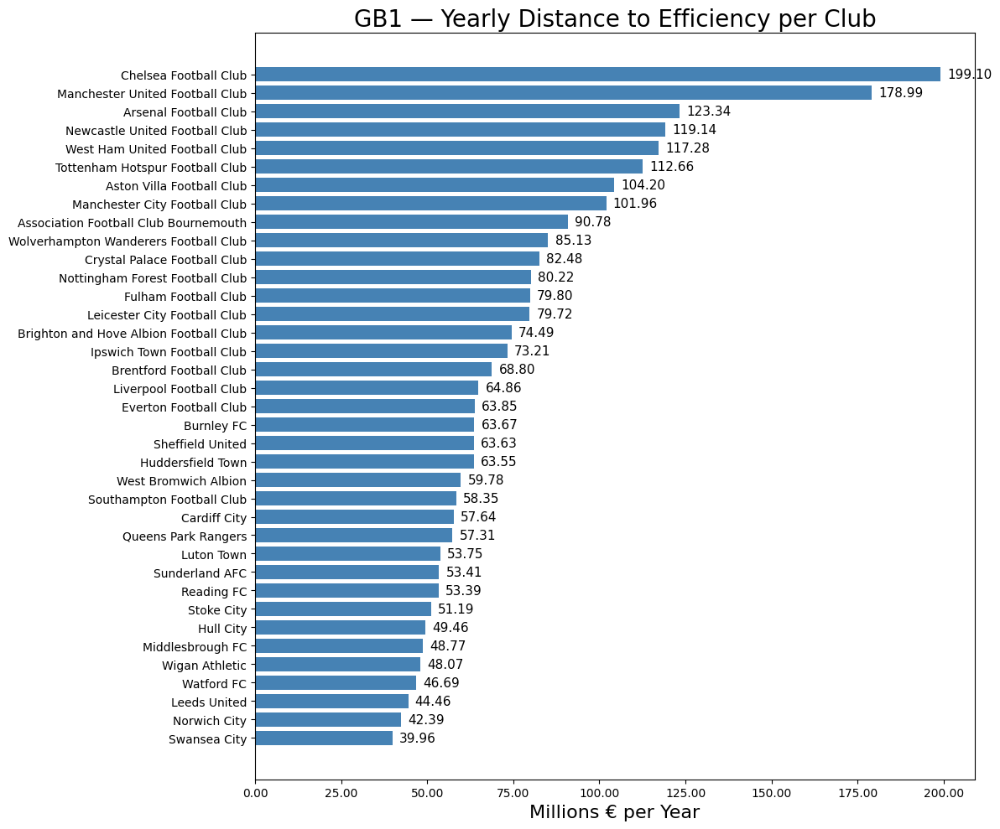

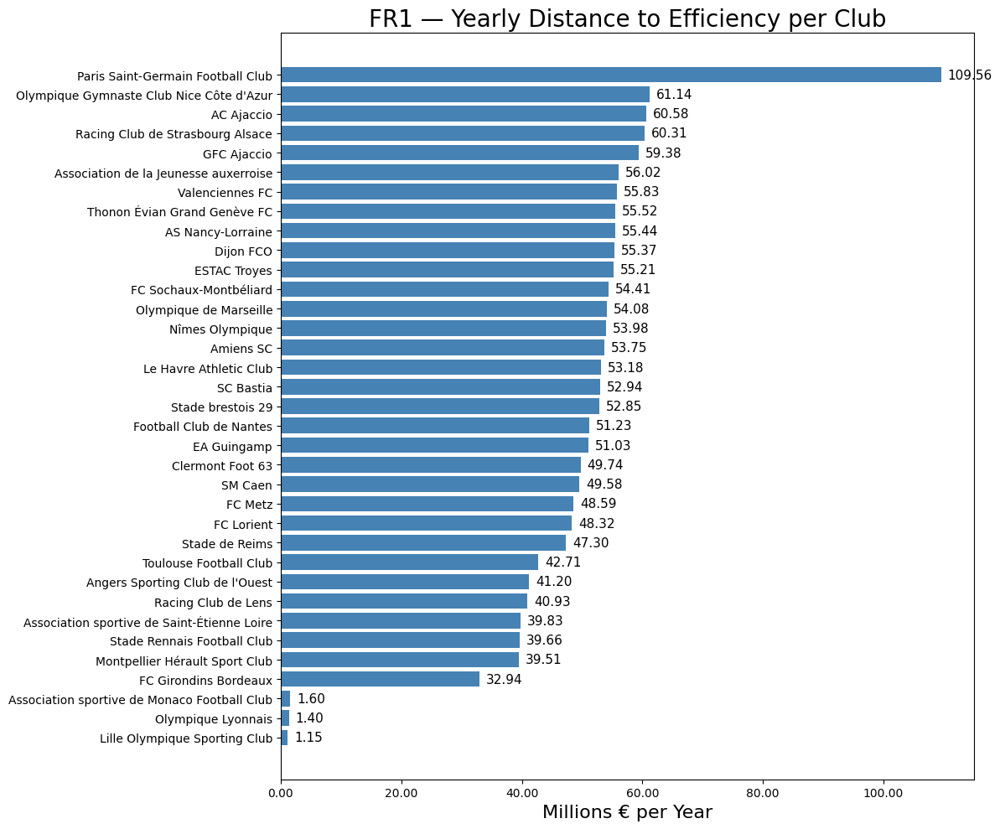

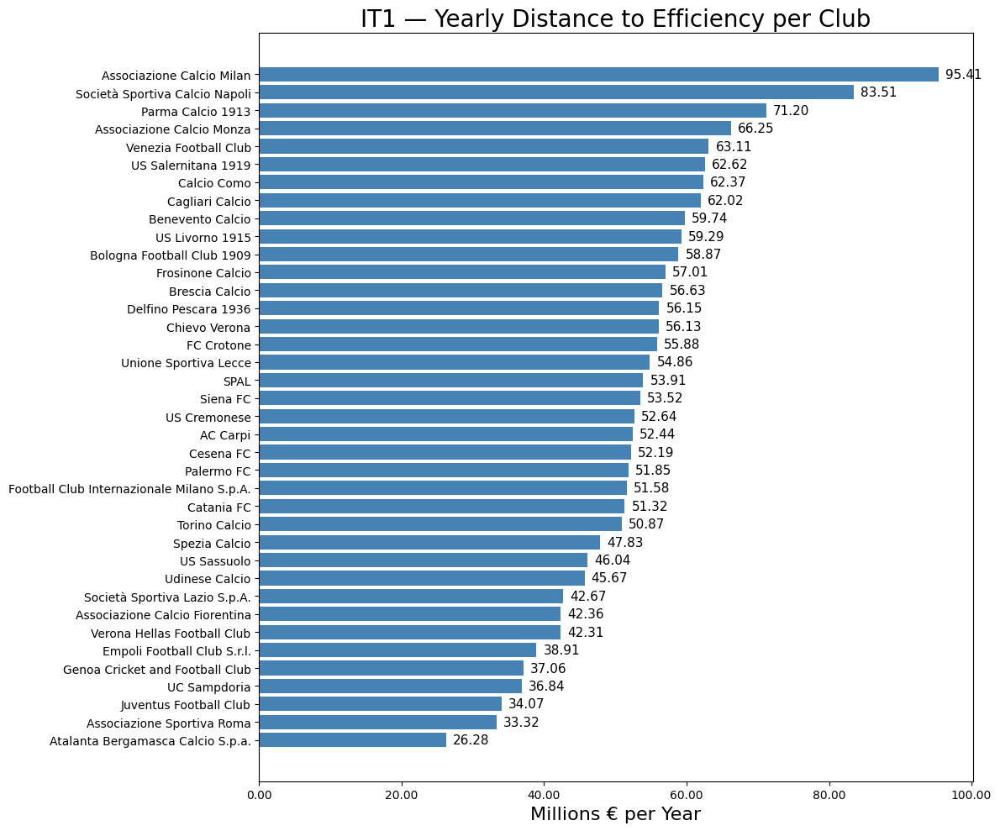

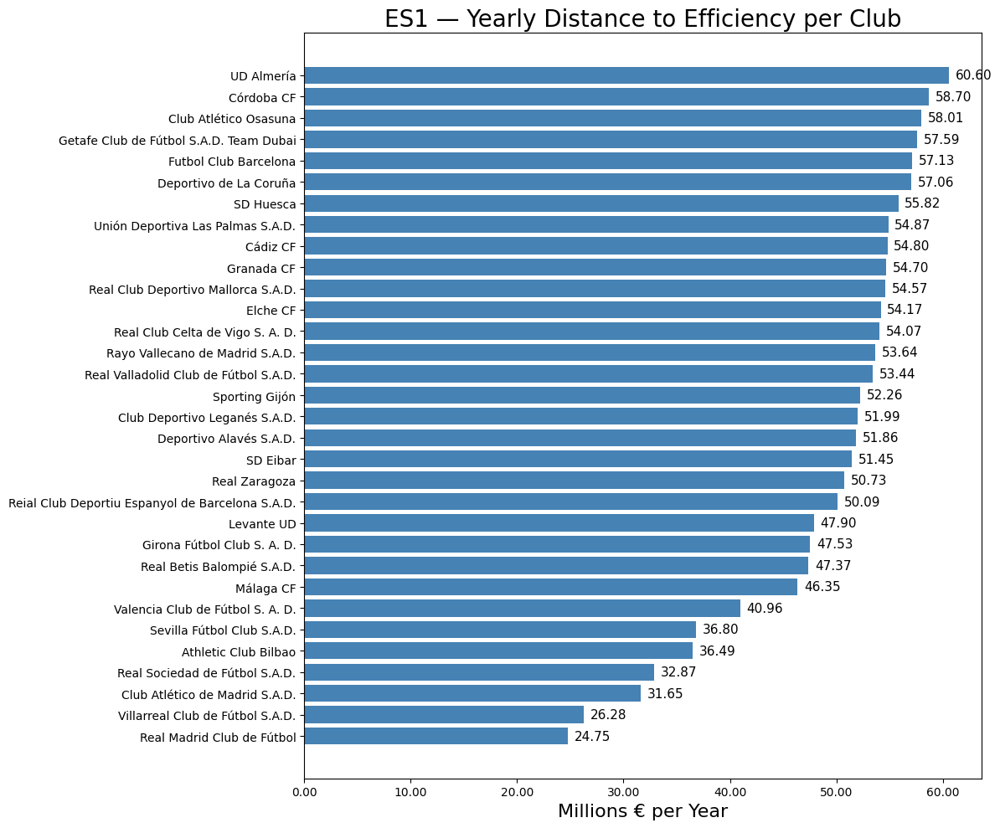

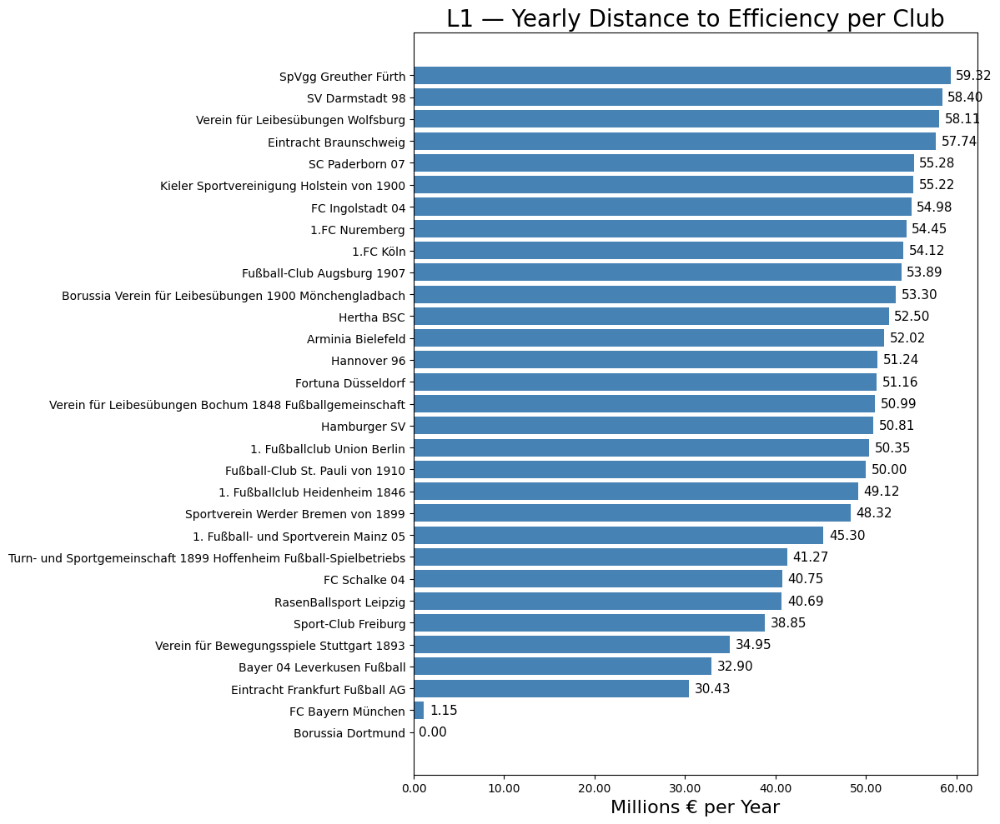

In [47]:
# Formatter
def fmt_m(x, _):
    return f"{x:,.2f}"

# Plot by League
for league in df_eff["domestic_competition_id"].unique():

    df_lg = df_eff[df_eff["domestic_competition_id"] == league].copy()
    df_lg = df_lg.sort_values("yearly_millions_to_efficiency", ascending=False)

    fig, ax = plt.subplots(figsize=(12, 10))

    bars = ax.barh(
        df_lg["club_name"],
        df_lg["yearly_millions_to_efficiency"],
        color="steelblue"
    )

    ax.invert_yaxis()  # Orden arriba→abajo
    ax.set_title(f"{league} — Yearly Distance to Efficiency per Club", fontsize=20)
    ax.set_xlabel("Millions € per Year", fontsize=16)

    ax.xaxis.set_major_formatter(FuncFormatter(fmt_m))

    # Add numbers on each bar
    for bar, value in zip(bars, df_lg["yearly_millions_to_efficiency"]):
        ax.text(
            bar.get_width() + (df_lg["yearly_millions_to_efficiency"].max() * 0.01), 
            bar.get_y() + bar.get_height() / 2,
            f"{value:,.2f}",
            va='center',
            ha='left',
            fontsize=11,
            color="black"
        )

    plt.tight_layout()
    plt.show()

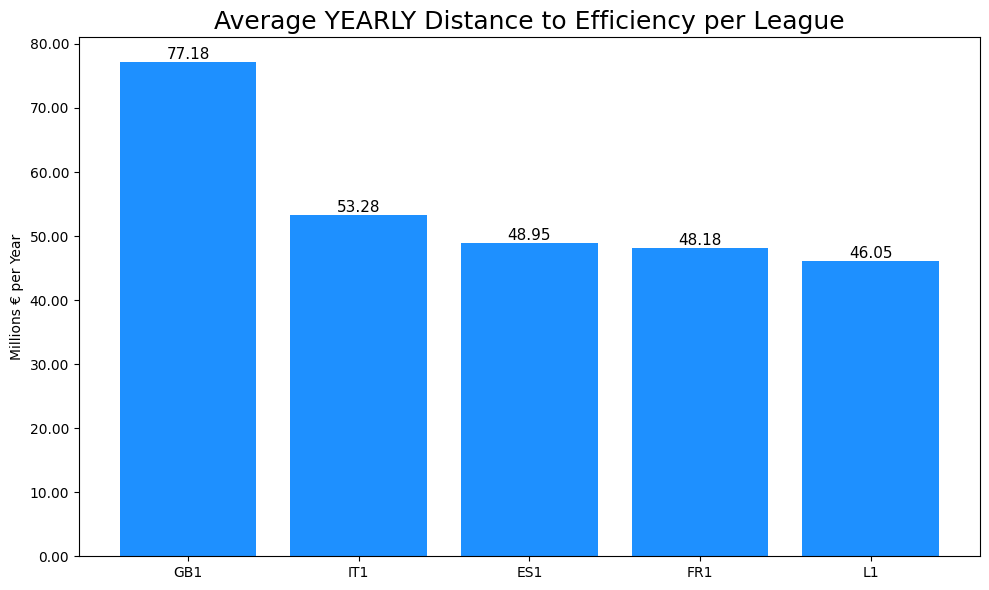

In [48]:
fig, ax = plt.subplots(figsize=(10, 6))

plot_df = avg_per_league_yearly.sort_values("yearly_millions_to_efficiency", ascending=False)

bars = ax.bar(plot_df["domestic_competition_id"], 
              plot_df["yearly_millions_to_efficiency"], 
              color="dodgerblue")

ax.set_title("Average YEARLY Distance to Efficiency per League", fontsize=18)
ax.set_ylabel("Millions € per Year")
ax.yaxis.set_major_formatter(FuncFormatter(fmt_m))

for bar, value in zip(bars, plot_df["yearly_millions_to_efficiency"]):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height(),
            f"{value:,.2f}",
            ha="center",
            va="bottom",
            fontsize=11)

plt.tight_layout()
plt.show()

### 6.3. Millions to Efficiency

In [49]:
df_eff = distance_to_efficiency_df.copy()

# Ensure yearly column exists
df_eff["yearly_millions_to_efficiency"] = df_eff["millions_to_efficiency"] / 8

# TOTAL MONEY WASTED (INEFFICIENCY)
total_wasted = df_eff["millions_to_efficiency"].sum()
total_wasted_yearly = df_eff["yearly_millions_to_efficiency"].sum()

# MONEY WASTED PER LEAGUE
wasted_per_league = (
    df_eff.groupby("domestic_competition_id")["millions_to_efficiency"]
    .sum()
    .reset_index()
    .rename(columns={"millions_to_efficiency": "total_wasted_millions"})
)

wasted_per_league_yearly = (
    df_eff.groupby("domestic_competition_id")["yearly_millions_to_efficiency"]
    .sum()
    .reset_index()
    .rename(columns={"yearly_millions_to_efficiency": "yearly_wasted_millions"})
)

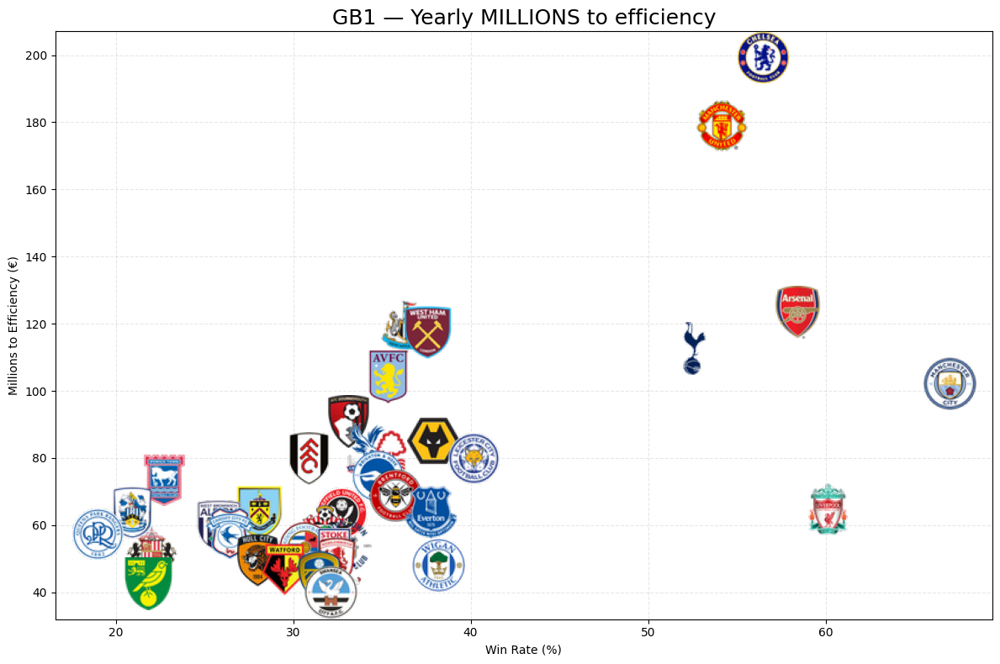

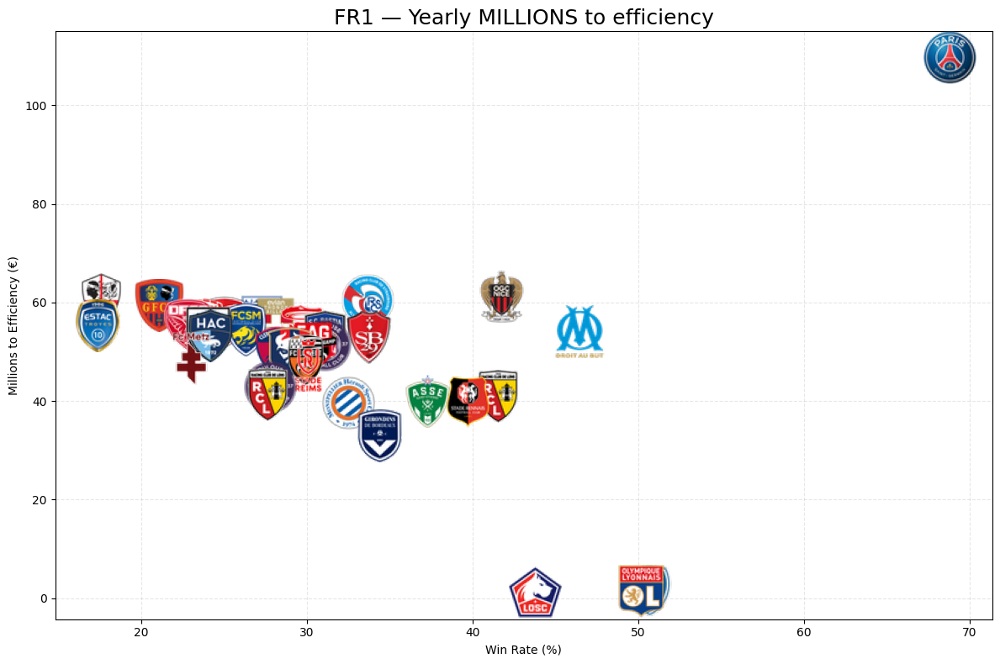

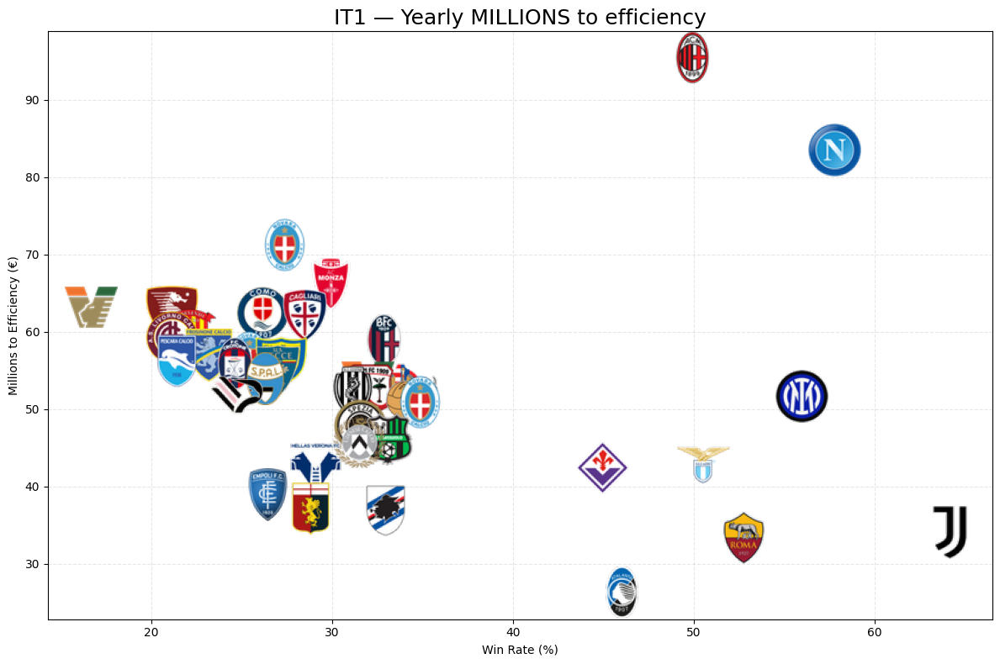

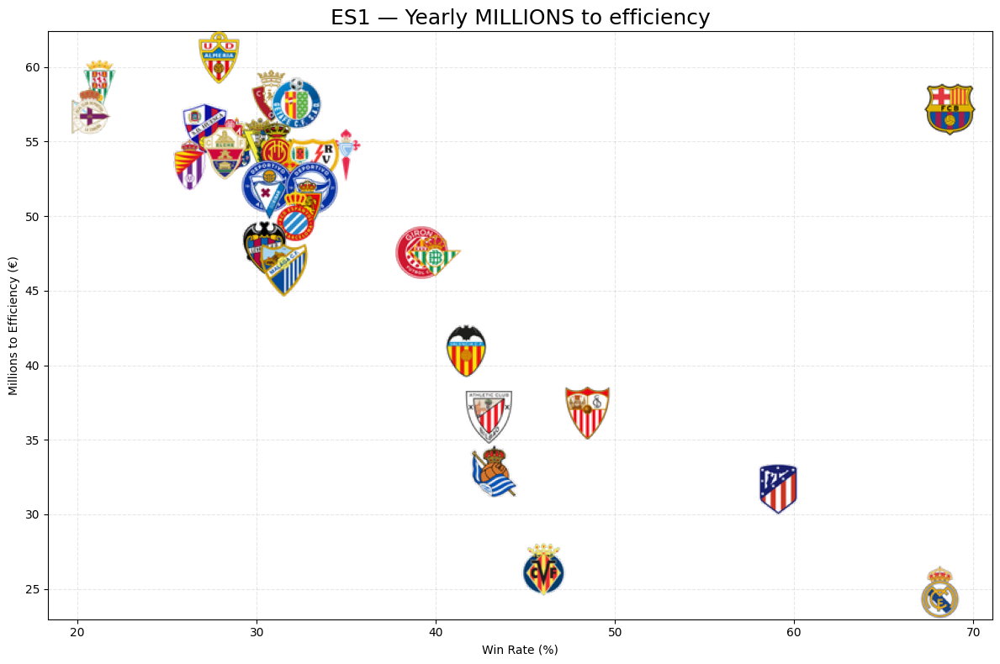

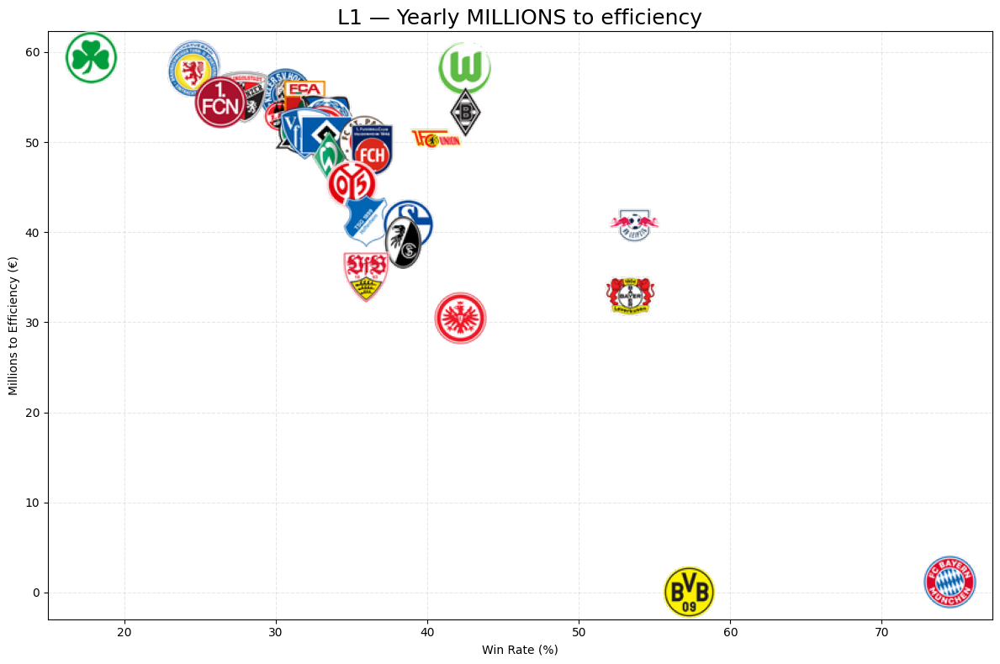

In [50]:
def load_logo(url, size=(45, 45)):
    try:
        response = requests.get(url, timeout=5)
        img = Image.open(BytesIO(response.content)).convert("RGBA")
        img = img.resize(size, Image.LANCZOS)
        return OffsetImage(img, zoom=1)
    except:
        return None

for league in df_eff["domestic_competition_id"].unique():
    
    df_lg = df_eff[df_eff["domestic_competition_id"] == league]

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.scatter(df_lg["win_rate"], df_lg["yearly_millions_to_efficiency"], alpha=0)

    for _, row in df_lg.iterrows():
        logo = load_logo(row["club_logo_url"], size=(45, 45))
        if logo:
            ab = AnnotationBbox(
                logo, 
                (row["win_rate"], row["yearly_millions_to_efficiency"]),
                frameon=False
            )
            ax.add_artist(ab)

    ax.set_title(f"{league} — Yearly MILLIONS to efficiency", fontsize=18)
    ax.set_xlabel("Win Rate (%)")
    ax.set_ylabel("Millions to Efficiency (€)")
    ax.grid(True, linestyle="--", alpha=0.3)

    plt.tight_layout()
    plt.show()

In [51]:
df = distance_to_efficiency_df.copy()

# Create interactive boxplot
fig = px.box(
    df,
    x='domestic_competition_id',
    y='yearly_millions_to_efficiency',
    points="all",  # Show all data points
    hover_data={
        'club_name': True,
        'millions_to_efficiency': True,
        'yearly_millions_to_efficiency': True,
        'normalized_distance': True,
        'domestic_competition_id': False
    },
    title='Distribution of Yearly Millions to Efficiency per League'
)

fig.update_traces(marker=dict(opacity=0.6, size=6))
fig.update_layout(
    yaxis_title='Yearly Millions to Efficiency',
    xaxis_title='Domestic Competition ID',
    boxmode='group',
    template='plotly_white'
)

# Show plot
fig.show()

### 6.4. Efficient Frontier per League

In [52]:
# SETTINGS
LEAGUES = ["ES1", "IT1", "FR1", "L1", "GB1"]
GAMMA = 0.05   # curvature parameter

# Output storage
league_figures = {}        # Store the plots
league_efficiency_dfs = {} # Store the efficiency tables

# MAIN LOOP: ONE FRONTIER PER LEAGUE
for league in LEAGUES:
    # Filter league data
    df = return_on_performance_df.copy()
    df = df[df["domestic_competition_id"] == league]
    df = df.dropna(subset=["win_rate", "return", "club_name"])

    # Identify points A (max return) and B (max win rate)
    A_point = df.loc[df["return"].idxmax()]
    B_point = df.loc[df["win_rate"].idxmax()]

    W_A, R_A = float(A_point["win_rate"]), float(A_point["return"])
    W_B, R_B = float(B_point["win_rate"]), float(B_point["return"])

    # R(W) = A - B * exp(gamma * W)
    den = np.exp(GAMMA * W_B) - np.exp(GAMMA * W_A)
    B_param = (R_A - R_B) / den
    A_param = R_A + B_param * np.exp(GAMMA * W_A)

    # Full curve
    x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 400)
    y_curve = A_param - B_param * np.exp(GAMMA * x_curve)

    # Shift curve UP so it covers ALL league Pareto points
    pareto_df = df.sort_values(by="win_rate", ascending=False)
    pareto_points = []
    best_return = -np.inf

    for _, row in pareto_df.iterrows():
        if row["return"] > best_return:
            pareto_points.append(row)
            best_return = row["return"]

    pareto_df = pd.DataFrame(pareto_points)

    pareto_df["curve_pred"] = A_param - B_param * np.exp(GAMMA * pareto_df["win_rate"])
    upward_shift = max(0, max(pareto_df["return"] - pareto_df["curve_pred"]))
    A_param_shifted = A_param + upward_shift

    # Recompute curve
    y_curve = A_param_shifted - B_param * np.exp(GAMMA * x_curve)

    # Build league-specific plot
    fig = go.Figure()

    # Scatter
    fig.add_trace(go.Scatter(
        x=df["win_rate"],
        y=df["return"],
        mode="markers",
        marker=dict(size=10, color="gray", opacity=0.6),
        text=df["club_name"],
        hovertemplate="<b>%{text}</b><br>Win Rate: %{x:.1f}%<br>Return: €%{y:,.0f}<extra></extra>",
        name="Clubs"
    ))

    # Frontier curve
    fig.add_trace(go.Scatter(
        x=x_curve,
        y=y_curve,
        mode="lines",
        line=dict(color="blue", width=4),
        name="Efficient Frontier"
    ))

    # Max return
    fig.add_trace(go.Scatter(
        x=[W_A], y=[R_A],
        mode="markers+text",
        marker=dict(size=14, color="red"),
        text=[A_point["club_name"]],
        textposition="top center",
        name="Max Return"
    ))

    # Max win rate
    fig.add_trace(go.Scatter(
        x=[W_B], y=[R_B],
        mode="markers+text",
        marker=dict(size=14, color="green"),
        text=[B_point["club_name"]],
        textposition="bottom center",
        name="Max Win Rate"
    ))

    # Red inefficient region
    y_min_league = float(df["return"].min())
    y_floor = y_min_league - 0.05 * (df["return"].max() - y_min_league)

    fig.add_trace(go.Scatter(
        x=x_curve, y=[y_floor]*len(x_curve),
        mode="lines",
        line=dict(width=0),
        showlegend=False,
        hoverinfo="skip"
    ))

    fig.add_trace(go.Scatter(
        x=x_curve, y=y_curve,
        mode="lines",
        line=dict(width=0),
        fill="tonexty",
        fillcolor="rgba(255, 0, 0, 0.15)",
        showlegend=False,
        hoverinfo="skip"
    ))

    fig.update_layout(
        template="plotly_white",
        title=f"Efficient Frontier — {league}",
        xaxis_title="Win Rate (%)",
        yaxis_title="Return (€)",
        hovermode="closest"
    )

    # Store figure
    league_figures[league] = fig

    # Distance-to-efficiency table for this league
    league_df = df.copy()
    league_df["frontier_return"] = A_param_shifted - B_param * np.exp(GAMMA * league_df["win_rate"])

    league_df["raw_distance"] = (league_df["frontier_return"] - league_df["return"]).clip(lower=0)

    league_df["millions_to_efficiency"] = league_df["raw_distance"] / 1_000_000
    league_df["yearly_millions_to_efficiency"] = league_df["millions_to_efficiency"] / 8

    dmin, dmax = league_df["millions_to_efficiency"].min(), league_df["millions_to_efficiency"].max()
    league_df["normalized_distance"] = (league_df["millions_to_efficiency"] - dmin) / (dmax - dmin)

    # Final clean table
    distance_table = league_df[
        [
            "club_id",
            "club_name",
            "win_rate",
            "return",
            "frontier_return",
            "millions_to_efficiency",
            "yearly_millions_to_efficiency",
            "normalized_distance"
        ]
    ].sort_values(by="millions_to_efficiency", ascending=False)

    league_efficiency_dfs[league] = distance_table

for lg in LEAGUES:
    league_figures[lg].show()

/var/folders/n3/51mt4jwn7d98lg6cndp687dc0000gn/T/ipykernel_71128/903165199.py:128: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



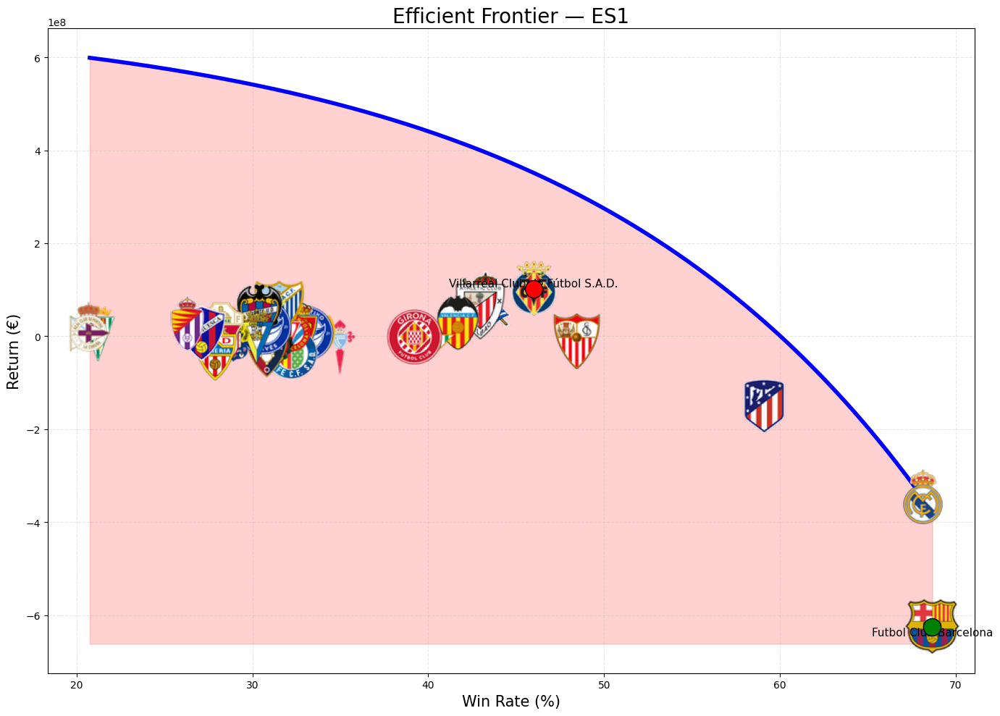

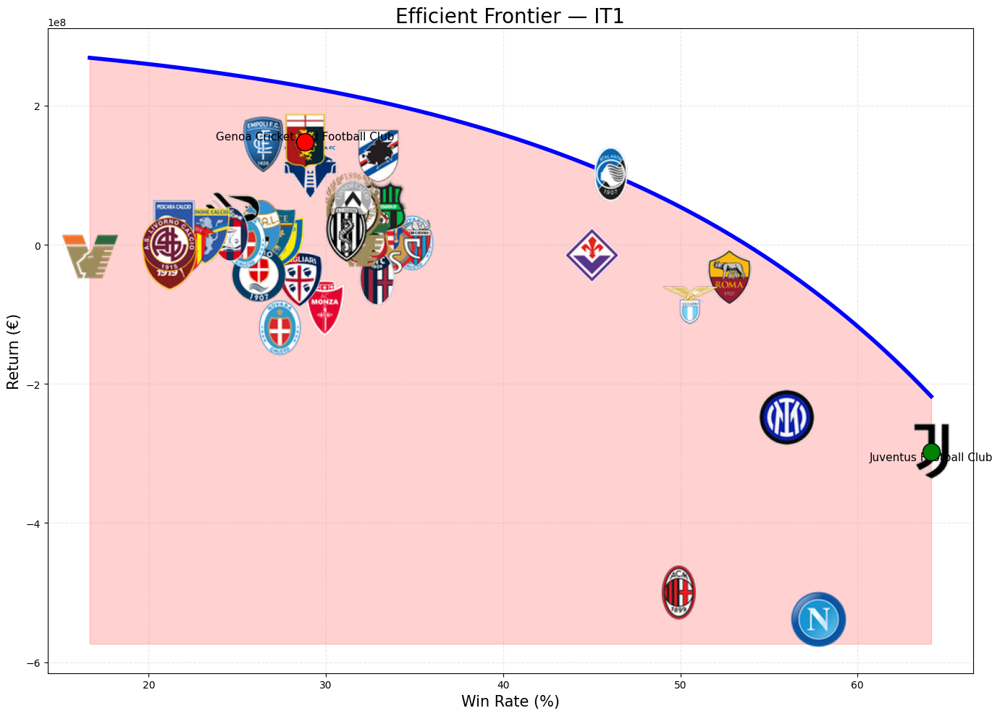

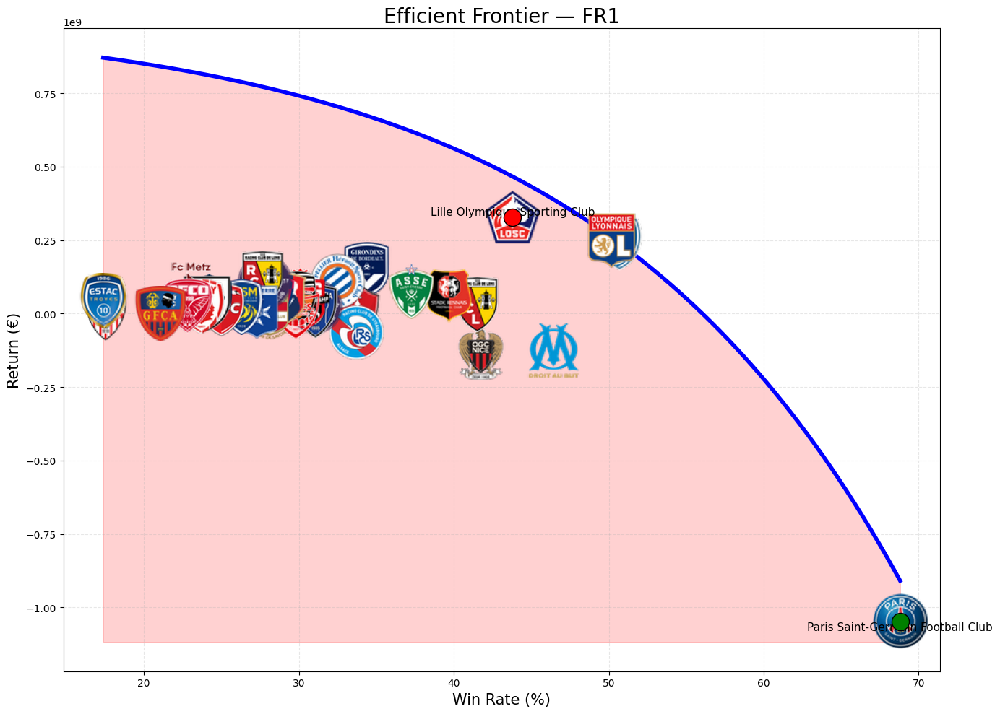

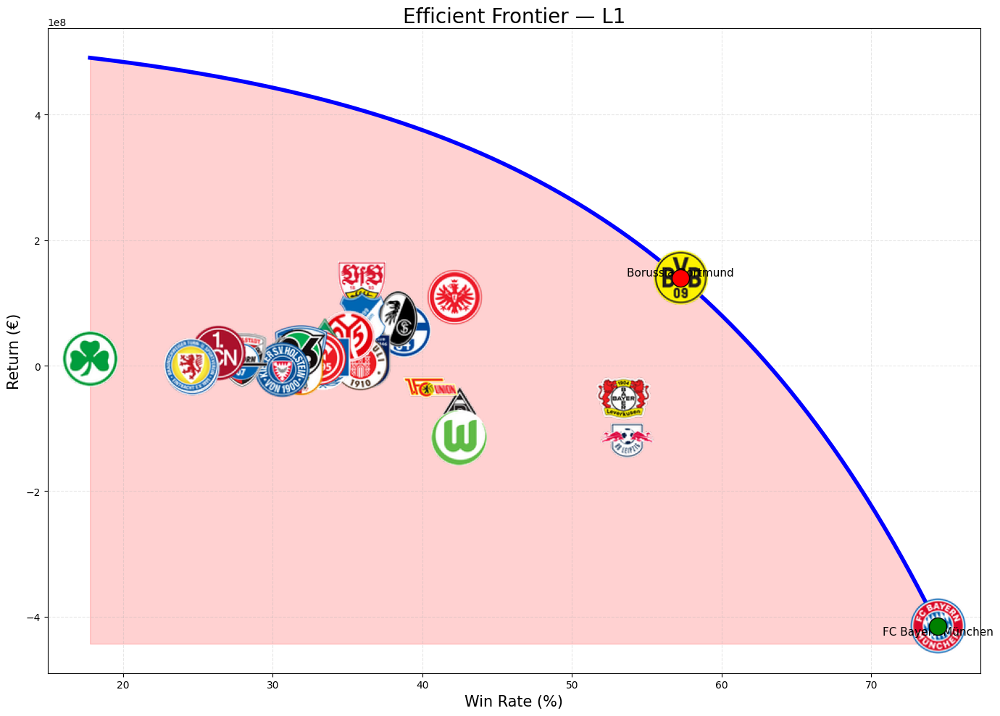

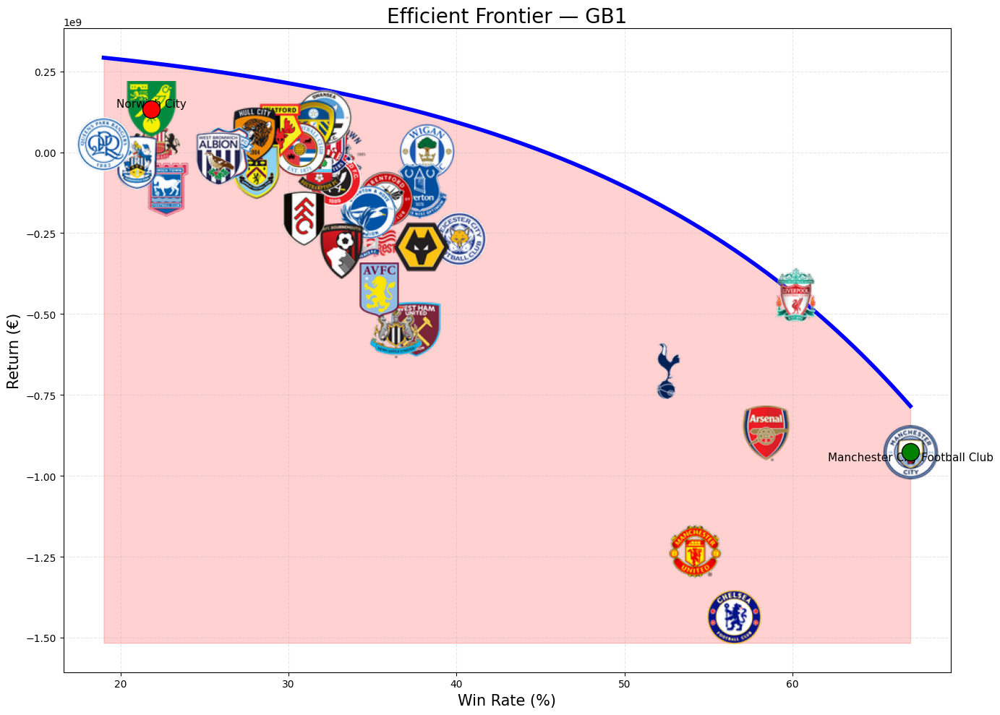

In [53]:
# Load logo from URL
def load_logo(url, size=(55, 55)):
    try:
        r = requests.get(url, timeout=4)
        img = Image.open(BytesIO(r.content)).convert("RGBA")
        img = img.resize(size, Image.LANCZOS)
        return img
    except:
        return None


# SETTINGS
LEAGUES = ["ES1", "IT1", "FR1", "L1", "GB1"]
GAMMA = 0.05

league_figures = {}
league_efficiency_dfs = {}

# MAIN LOOP (One frontier per league)
for league in LEAGUES:
    # Filter data
    df = return_on_performance_df.copy()
    df = df[df["domestic_competition_id"] == league].dropna(subset=["win_rate", "return"])

    # Identify point A (max return) & B (max win rate)
    A_point = df.loc[df["return"].idxmax()]
    B_point = df.loc[df["win_rate"].idxmax()]

    W_A, R_A = float(A_point["win_rate"]), float(A_point["return"])
    W_B, R_B = float(B_point["win_rate"]), float(B_point["return"])

    # R(W) = A - B * exp(gamma W)
    den = np.exp(GAMMA * W_B) - np.exp(GAMMA * W_A)
    B_param = (R_A - R_B) / den
    A_param = R_A + B_param * np.exp(GAMMA * W_A)

    x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 300)
    y_curve = A_param - B_param * np.exp(GAMMA * x_curve)

    # Shift curve UP so it covers Pareto points
    pareto_df = df.sort_values("win_rate", ascending=False)
    best_return = -np.inf
    pareto_points = []

    for _, r in pareto_df.iterrows():
        if r["return"] > best_return:
            pareto_points.append(r)
            best_return = r["return"]

    pareto_df = pd.DataFrame(pareto_points)

    pareto_df["curve_pred"] = A_param - B_param * np.exp(GAMMA * pareto_df["win_rate"])
    upward_shift = max(0, max(pareto_df["return"] - pareto_df["curve_pred"]))
    A_param_shifted = A_param + upward_shift

    y_curve = A_param_shifted - B_param * np.exp(GAMMA * x_curve)

    # Matplotlib figure
    fig, ax = plt.subplots(figsize=(14, 10))

    # Red inefficient region
    y_min_league = float(df["return"].min())
    y_floor = y_min_league - 0.05 * (df["return"].max() - y_min_league)

    ax.fill_between(
        x_curve, y_curve, y_floor,
        color=(1, 0, 0, 0.18),
        label="Inefficient Region"
    )

    # Frontier curve (blue)
    ax.plot(x_curve, y_curve, color="blue", linewidth=4, label="Efficient Frontier")

    # Scatter using logos
    for _, row in df.iterrows():
        logo = load_logo(row["club_logo_url"], size=(55, 55))
        if logo is not None:
            oi = OffsetImage(logo, zoom=1)
            ab = AnnotationBbox(oi, (row["win_rate"], row["return"]), frameon=False)
            ax.add_artist(ab)

    # Max return (red circle)
    ax.scatter(W_A, R_A, s=300, color="red", edgecolors="black", zorder=5)
    ax.text(W_A, R_A, A_point["club_name"], fontsize=11, ha="center", va="bottom")

    # Max win rate (green circle)
    ax.scatter(W_B, R_B, s=300, color="green", edgecolors="black", zorder=5)
    ax.text(W_B, R_B, B_point["club_name"], fontsize=11, ha="center", va="top")

    # Layout
    ax.set_title(f"Efficient Frontier — {league}", fontsize=20)
    ax.set_xlabel("Win Rate (%)", fontsize=15)
    ax.set_ylabel("Return (€)", fontsize=15)
    ax.grid(True, linestyle="--", alpha=0.3)

    fig.tight_layout()
    league_figures[league] = fig

    # Distance-to-efficiency table
    league_df = df.copy()
    league_df["frontier_return"] = A_param_shifted - B_param * np.exp(GAMMA * league_df["win_rate"])
    league_df["raw_distance"] = (league_df["frontier_return"] - league_df["return"]).clip(lower=0)
    league_df["millions_to_efficiency"] = league_df["raw_distance"] / 1_000_000
    league_df["yearly_millions_to_efficiency"] = league_df["millions_to_efficiency"] / 8

    dmin, dmax = league_df["millions_to_efficiency"].min(), league_df["millions_to_efficiency"].max()
    league_df["normalized_distance"] = (league_df["millions_to_efficiency"] - dmin) / (dmax - dmin)

    distance_table = league_df[
        [
            "club_id",
            "club_name",
            "win_rate",
            "return",
            "frontier_return",
            "millions_to_efficiency",
            "yearly_millions_to_efficiency",
            "normalized_distance",
            "club_logo_url"
        ]
    ].sort_values("millions_to_efficiency", ascending=False)

    league_efficiency_dfs[league] = distance_table


# SHOW ALL FIGURES
for league in LEAGUES:
    league_figures[league].show()

/var/folders/n3/51mt4jwn7d98lg6cndp687dc0000gn/T/ipykernel_71128/159735857.py:121: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



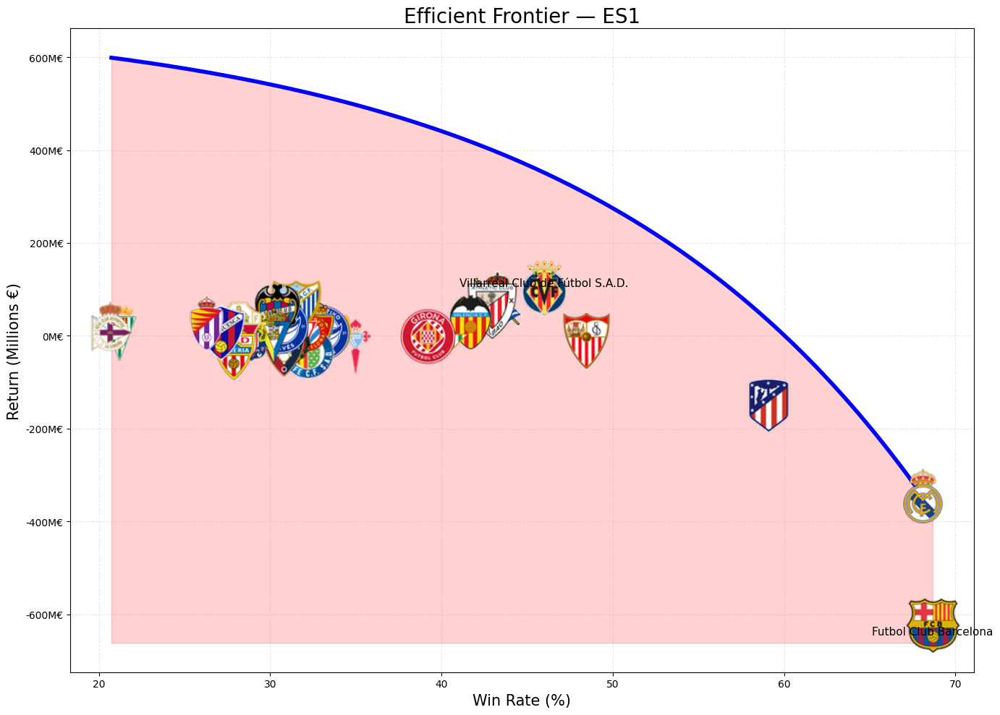

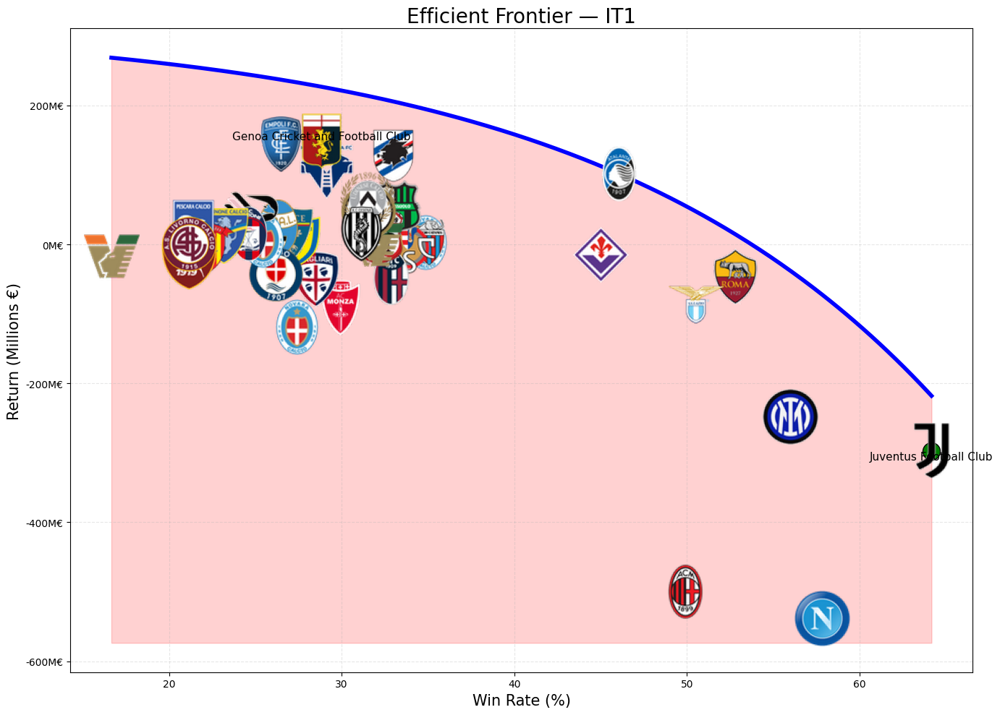

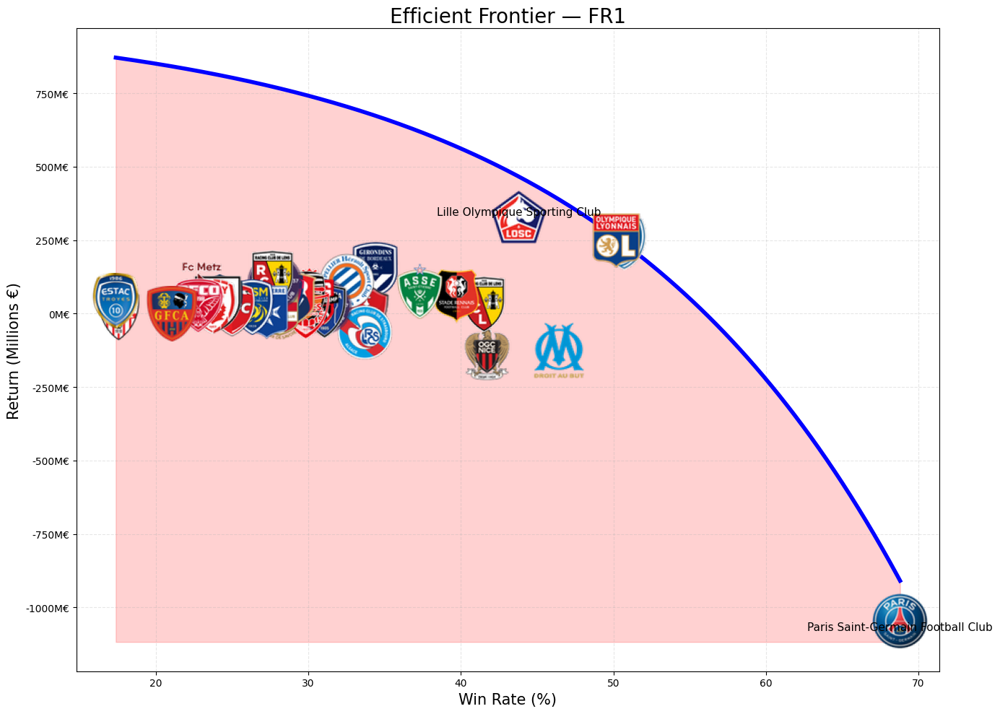

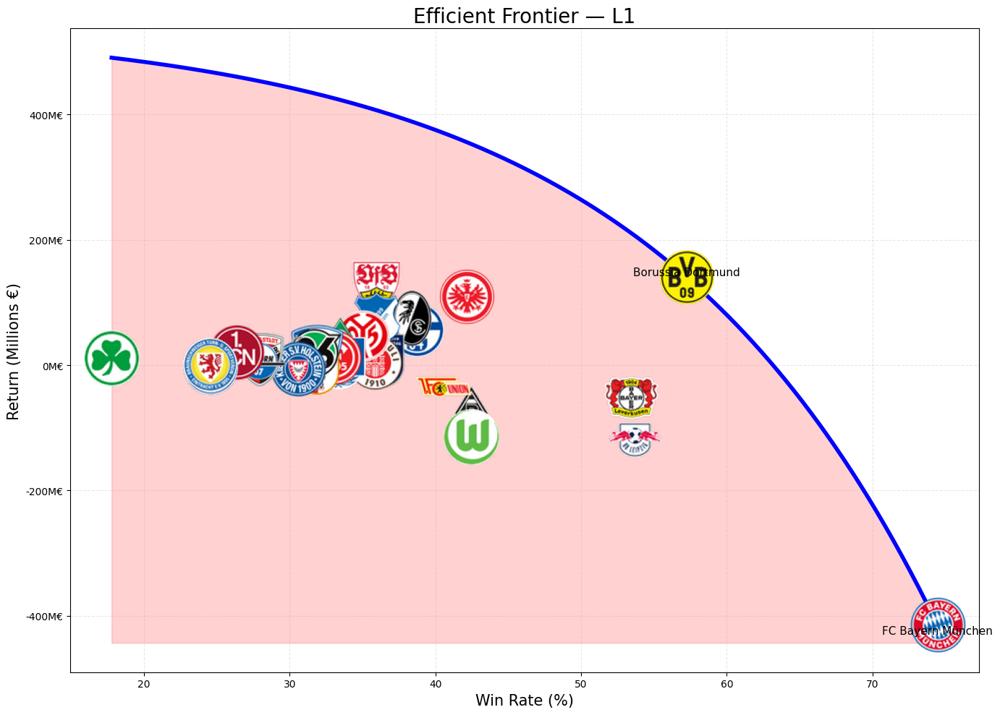

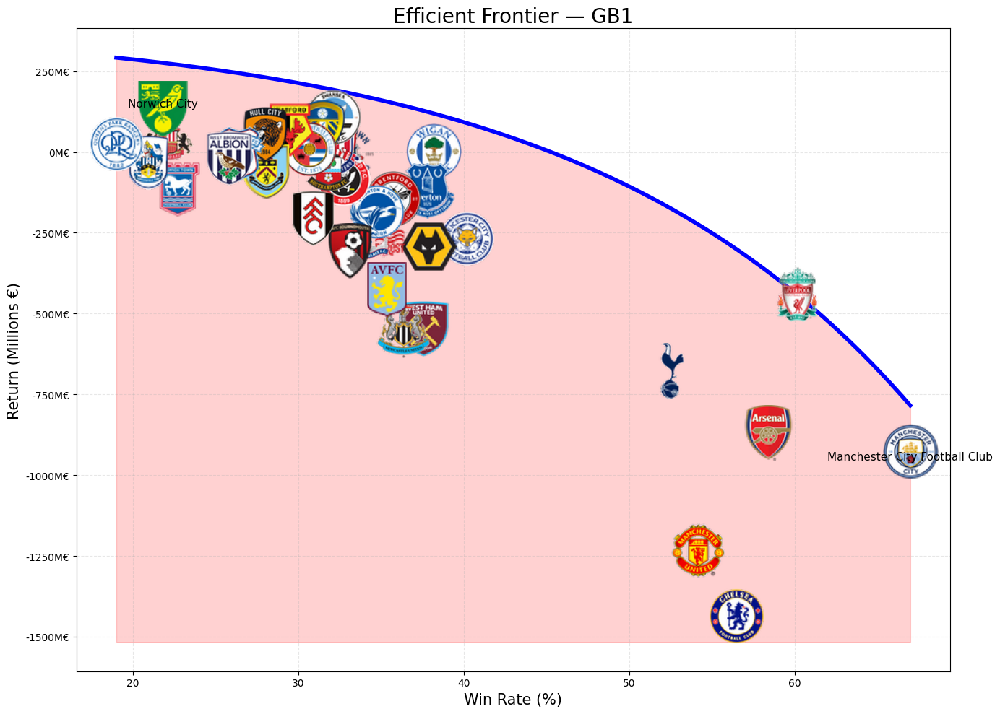

In [54]:
# Load logo from URL
def load_logo(url, size=(55, 55)):
    try:
        r = requests.get(url, timeout=4)
        img = Image.open(BytesIO(r.content)).convert("RGBA")
        img = img.resize(size, Image.LANCZOS)
        return img
    except:
        return None

# SETTINGS
LEAGUES = ["ES1", "IT1", "FR1", "L1", "GB1"]
GAMMA = 0.05

league_figures = {}
league_efficiency_dfs = {}

# MAIN LOOP
for league in LEAGUES:
    df = return_on_performance_df.copy()
    df = df[df["domestic_competition_id"] == league].dropna(subset=["win_rate", "return"])

    A_point = df.loc[df["return"].idxmax()]
    B_point = df.loc[df["win_rate"].idxmax()]

    W_A, R_A = float(A_point["win_rate"]), float(A_point["return"])
    W_B, R_B = float(B_point["win_rate"]), float(B_point["return"])

    # Frontier parameters
    den = np.exp(GAMMA * W_B) - np.exp(GAMMA * W_A)
    B_param = (R_A - R_B) / den
    A_param = R_A + B_param * np.exp(GAMMA * W_A)

    x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 300)
    y_curve = A_param - B_param * np.exp(GAMMA * x_curve)

    # Shift up
    pareto_df = df.sort_values("win_rate", ascending=False)
    best_return = -np.inf
    pts = []

    for _, r in pareto_df.iterrows():
        if r["return"] > best_return:
            pts.append(r)
            best_return = r["return"]

    pareto_df = pd.DataFrame(pts)
    pareto_df["curve_pred"] = A_param - B_param * np.exp(GAMMA * pareto_df["win_rate"])

    upward_shift = max(0, max(pareto_df["return"] - pareto_df["curve_pred"]))
    A_param_shifted = A_param + upward_shift

    y_curve = A_param_shifted - B_param * np.exp(GAMMA * x_curve)

    # Matplotlib figure
    fig, ax = plt.subplots(figsize=(14, 10))

    y_min_league = float(df["return"].min())
    y_floor = y_min_league - 0.05 * (df["return"].max() - y_min_league)

    ax.fill_between(x_curve, y_curve, y_floor, color=(1, 0, 0, 0.18))
    ax.plot(x_curve, y_curve, color="blue", linewidth=4)

    # Logos
    for _, row in df.iterrows():
        logo = load_logo(row["club_logo_url"], size=(55, 55))
        if logo is not None:
            ab = AnnotationBbox(
                OffsetImage(logo, zoom=1),
                (row["win_rate"], row["return"]),
                frameon=False
            )
            ax.add_artist(ab)

    # A & B
    ax.scatter(W_A, R_A, s=300, color="red", edgecolors="black")
    ax.text(W_A, R_A, A_point["club_name"], fontsize=11, ha="center", va="bottom")

    ax.scatter(W_B, R_B, s=300, color="green", edgecolors="black")
    ax.text(W_B, R_B, B_point["club_name"], fontsize=11, ha="center", va="top")

    ax.yaxis.set_major_formatter(
        mtick.FuncFormatter(lambda x, _: f"{x/1_000_000:.0f}M€")
    )

    ax.set_title(f"Efficient Frontier — {league}", fontsize=20)
    ax.set_xlabel("Win Rate (%)", fontsize=15)
    ax.set_ylabel("Return (Millions €)", fontsize=15)
    ax.grid(True, linestyle="--", alpha=0.3)

    fig.tight_layout()
    league_figures[league] = fig

    # Efficiency table
    league_df = df.copy()
    league_df["frontier_return"] = A_param_shifted - B_param * np.exp(GAMMA * league_df["win_rate"])
    league_df["raw_distance"] = (league_df["frontier_return"] - league_df["return"]).clip(lower=0)
    league_df["millions_to_efficiency"] = league_df["raw_distance"] / 1_000_000
    league_df["yearly_millions_to_efficiency"] = league_df["millions_to_efficiency"] / 8

    dmin, dmax = league_df["millions_to_efficiency"].min(), league_df["millions_to_efficiency"].max()
    league_df["normalized_distance"] = (league_df["millions_to_efficiency"] - dmin) / (dmax - dmin)

    distance_table = league_df[[
        "club_id",
        "club_name",
        "win_rate",
        "return",
        "frontier_return",
        "millions_to_efficiency",
        "yearly_millions_to_efficiency",
        "normalized_distance",
        "club_logo_url"
    ]].sort_values(by="millions_to_efficiency", ascending=False)

    league_efficiency_dfs[league] = distance_table


# SHOW FIGURES
for league in LEAGUES:
    league_figures[league].show()

### 6.5. Distributions

In [55]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# FILTER → La Liga + win_rate ≤ 50%
df = return_on_performance_df.copy()
df = df[
    (df["domestic_competition_id"] == "ES1") &
    (df["win_rate"] <= 60) &
    df["win_rate"].notna() &
    df["return"].notna()
].copy()

df = df.dropna(subset=["club_name"])

GAMMA = 0.05

# Identify A (max return) and B (max win rate <=50%)
A_point = df.loc[df["return"].idxmax()]
B_point = df.loc[df["win_rate"].idxmax()]   # Now max <=50%

W_A, R_A = float(A_point["win_rate"]), float(A_point["return"])
W_B, R_B = float(B_point["win_rate"]), float(B_point["return"])

# Compute raw exponential frontier parameters
den = np.exp(GAMMA * W_B) - np.exp(GAMMA * W_A)
B_param = (R_A - R_B) / den
A_param = R_A + B_param * np.exp(GAMMA * W_A)

# Initial curve
x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 400)
y_curve = A_param - B_param * np.exp(GAMMA * x_curve)

# SHIFT curve UP to cover all Pareto points
pareto_df = df.sort_values(by="win_rate", ascending=False)
pareto_points = []
best_return = -np.inf

for _, row in pareto_df.iterrows():
    if row["return"] > best_return:
        pareto_points.append(row)
        best_return = row["return"]

pareto_df = pd.DataFrame(pareto_points)

pareto_df["curve_pred"] = A_param - B_param * np.exp(GAMMA * pareto_df["win_rate"])
upward_shift = max(0, max(pareto_df["return"] - pareto_df["curve_pred"]))

A_param_shifted = A_param + upward_shift

# Final curve
y_curve = A_param_shifted - B_param * np.exp(GAMMA * x_curve)


# Plot efficient frontier
fig = go.Figure()

# Scatter of clubs
fig.add_trace(go.Scatter(
    x=df["win_rate"],
    y=df["return"],
    mode="markers",
    marker=dict(size=10, color="gray", opacity=0.6),
    text=df["club_name"],
    hovertemplate="<b>%{text}</b><br>Win Rate: %{x:.1f}%<br>Return: €%{y:,.0f}<extra></extra>",
    name="Clubs"
))

# Frontier curve
fig.add_trace(go.Scatter(
    x=x_curve,
    y=y_curve,
    mode="lines",
    line=dict(color="blue", width=4),
    name="Efficient Frontier"
))

# A (max return)
fig.add_trace(go.Scatter(
    x=[W_A], y=[R_A],
    mode="markers+text",
    marker=dict(size=14, color="red"),
    text=[A_point["club_name"]],
    textposition="top center",
    name="Max Return"
))

# B (max win rate <=50%)
fig.add_trace(go.Scatter(
    x=[W_B], y=[R_B],
    mode="markers+text",
    marker=dict(size=14, color="green"),
    text=[B_point["club_name"]],
    textposition="bottom center",
    name="Max Win Rate (≤50%)"
))

# Red inefficient region
y_floor = df["return"].min() - 0.05 * (df["return"].max() - df["return"].min())

fig.add_trace(go.Scatter(
    x=x_curve, y=[y_floor]*len(x_curve),
    mode="lines",
    line=dict(width=0),
    showlegend=False,
    hoverinfo="skip"
))

fig.add_trace(go.Scatter(
    x=x_curve, y=y_curve,
    mode="lines",
    line=dict(width=0),
    fill="tonexty",
    fillcolor="rgba(255, 0, 0, 0.15)",
    showlegend=False,
    hoverinfo="skip"
))

fig.update_layout(
    template="plotly_white",
    title="Efficient Frontier — La Liga (ES1) — Teams with Win Rate ≤ 50%",
    xaxis_title="Win Rate (%)",
    yaxis_title="Return (€)",
    hovermode="closest"
)

fig.show()


# TABLE — Distance to Efficiency
df["frontier_return"] = A_param_shifted - B_param * np.exp(GAMMA * df["win_rate"])
df["raw_distance"] = (df["frontier_return"] - df["return"]).clip(lower=0)
df["millions_to_efficiency"] = df["raw_distance"] / 1_000_000
df["yearly_millions_to_efficiency"] = df["millions_to_efficiency"] / 8

dmin, dmax = df["millions_to_efficiency"].min(), df["millions_to_efficiency"].max()
df["normalized_distance"] = (df["millions_to_efficiency"] - dmin) / (dmax - dmin)

distance_ES1 = df[
    [
        "club_id",
        "club_name",
        "win_rate",
        "return",
        "frontier_return",
        "millions_to_efficiency",
        "yearly_millions_to_efficiency",
        "normalized_distance"
    ]
].sort_values(by="millions_to_efficiency", ascending=False)

distance_ES1

,club_id,club_name,win_rate,return,frontier_return,millions_to_efficiency,yearly_millions_to_efficiency,normalized_distance
128,3302.0,UD Almería,27.894737,-36480450.0,2.656921e+08,302.172530,37.771566,1.000000
162,993.0,Córdoba CF,21.212121,4942500.0,2.972199e+08,292.277410,36.534676,0.967253
167,897.0,Deportivo de La Coruña,20.737327,19575000.0,2.990843e+08,279.509288,34.938661,0.924999
103,331.0,Club Atlético Osasuna,30.789474,-30088000.0,2.484058e+08,278.493777,34.811722,0.921638
83,3709.0,Getafe Club de Fútbol S.A.D. Team Dubai,32.200000,-34516600.0,2.390317e+08,273.548290,34.193536,0.905272
135,5358.0,SD Huesca,27.102804,5330550.0,2.700013e+08,264.670796,33.083850,0.875893
118,472.0,Unión Deportiva Las Palmas S.A.D.,28.888889,4648450.0,2.600352e+08,255.386760,31.923345,0.845169
120,16795.0,Granada CF,28.498728,7907000.0,2.622889e+08,254.381864,31.797733,0.841843
110,2687.0,Cádiz CF,30.208333,-1403500.0,2.520797e+08,253.483199,31.685400,0.838869
98,237.0,Real Club Deportivo Mallorca S.A.D.,31.128405,-4460000.0,2.462133e+08,250.673277,31.334160,0.829570


In [56]:
def efficient_frontier_filtered(
    df_base,
    league="ES1",
    min_win_rate=0,
    max_win_rate=100,
    gamma=0.05,
    logo_size=(55,55)
):

    # FILTER BY LEAGUE + WIN RATE
    df = df_base.copy()
    df = df[
        (df["domestic_competition_id"] == league) &
        (df["win_rate"] >= min_win_rate) &
        (df["win_rate"] <= max_win_rate) &
        df["win_rate"].notna() &
        df["return"].notna()
    ].copy()

    df = df.dropna(subset=["club_name"])

    if df.empty:
        print("⚠ No hay clubes con ese filtro.")
        return None, None, None

    # A = greater return / B = max win
    A_point = df.loc[df["return"].idxmax()]
    B_point = df.loc[df["win_rate"].idxmax()]

    W_A, R_A = float(A_point["win_rate"]), float(A_point["return"])
    W_B, R_B = float(B_point["win_rate"]), float(B_point["return"])

    # Exponential curve
    den = np.exp(gamma * W_B) - np.exp(gamma * W_A)
    B_param = (R_A - R_B) / den
    A_param = R_A + B_param * np.exp(gamma * W_A)

    x_curve = np.linspace(df["win_rate"].min(), df["win_rate"].max(), 400)
    y_curve = A_param - B_param * np.exp(gamma * x_curve)

    # SHIFT UP TO COVER PARETO
    pareto_df = df.sort_values(by="win_rate", ascending=False)
    best = -np.inf
    pts = []

    for _, r in pareto_df.iterrows():
        if r["return"] > best:
            pts.append(r)
            best = r["return"]

    pareto_df = pd.DataFrame(pts)
    pareto_df["pred"] = A_param - B_param * np.exp(gamma * pareto_df["win_rate"])

    upward_shift = max(0, max(pareto_df["return"] - pareto_df["pred"]))
    A_param_shifted = A_param + upward_shift
    y_curve = A_param_shifted - B_param * np.exp(gamma * x_curve)

    # DISTANCE TO FRONTIER TABLE
    df["frontier_return"] = A_param_shifted - B_param * np.exp(gamma * df["win_rate"])
    df["raw_distance"] = (df["frontier_return"] - df["return"]).clip(lower=0)

    df["millions_to_efficiency"] = df["raw_distance"] / 1_000_000
    df["yearly_millions_to_efficiency"] = df["millions_to_efficiency"] / 8

    dmin, dmax = df["millions_to_efficiency"].min(), df["millions_to_efficiency"].max()
    df["normalized_distance"] = (df["millions_to_efficiency"] - dmin) / (dmax - dmin)

    table = df[
        [
            "club_id",
            "club_name",
            "win_rate",
            "return",
            "frontier_return",
            "millions_to_efficiency",
            "yearly_millions_to_efficiency",
            "normalized_distance",
            "club_logo_url"
        ]
    ].sort_values(by="millions_to_efficiency", ascending=False)

    # MATPLOTLIB
    fig_mpl, ax = plt.subplots(figsize=(14,10))
    y_floor = df["return"].min() - 0.05*(df["return"].max()-df["return"].min())

    ax.fill_between(x_curve, y_curve, y_floor, color=(1,0,0,0.18))
    ax.plot(x_curve, y_curve, color="blue", linewidth=4)

    # Logos
    for _, row in df.iterrows():
        logo = load_logo(row["club_logo_url"], size=logo_size)
        if logo is not None:
            ab = AnnotationBbox(
                OffsetImage(logo, zoom=1),
                (row["win_rate"], row["return"]),
                frameon=False
            )
            ax.add_artist(ab)

    # A & B points
    ax.scatter(W_A, R_A, s=250, color="red")
    ax.scatter(W_B, R_B, s=250, color="green")

    ax.text(W_A, R_A, A_point["club_name"], fontsize=10, ha="center", va="bottom")
    ax.text(W_B, R_B, B_point["club_name"], fontsize=10, ha="center", va="top")

    import matplotlib.ticker as mtick
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x/1_000_000:.0f}M€"))

    ax.set_title(f"Efficient Frontier — {league}\nFiltered {min_win_rate}%–{max_win_rate}%", fontsize=18)
    ax.set_xlabel("Win Rate (%)")
    ax.set_ylabel("Return (Millions €)")
    ax.grid(True, alpha=0.3)

    # PLOTLY INTERACTIVE
    fig_plotly = go.Figure()

    fig_plotly.add_trace(go.Scatter(
        x=df["win_rate"], y=df["return"],
        mode="markers",
        marker=dict(size=10,color='gray'),
        text=df["club_name"],
        name="Clubs"
    ))

    fig_plotly.add_trace(go.Scatter(
        x=x_curve, y=y_curve,
        mode="lines",
        line=dict(color="blue", width=4),
        name="Frontier"
    ))

    fig_plotly.update_layout(
        template="plotly_white",
        title=f"Efficient Frontier — {league}",
        xaxis_title="Win Rate (%)",
        yaxis_title="Return (€)"
    )

    return fig_mpl, fig_plotly, table

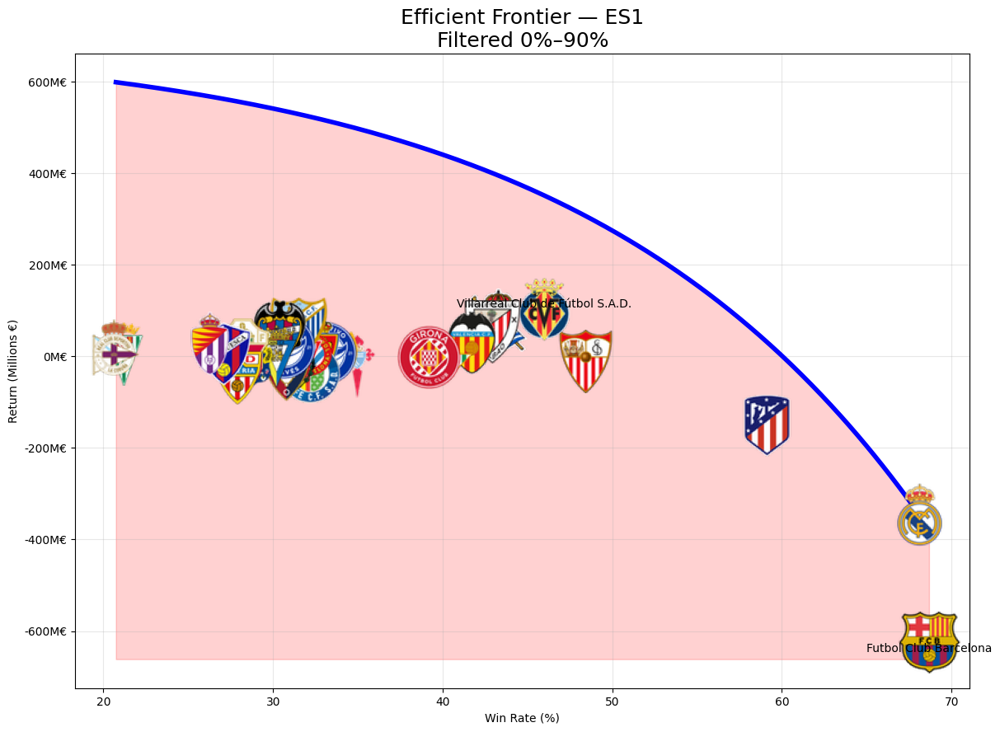

In [57]:
fig_mpl, fig_plotly, tab = efficient_frontier_filtered(
    return_on_performance_df,
    league="ES1",
    min_win_rate=0,
    max_win_rate=90
)

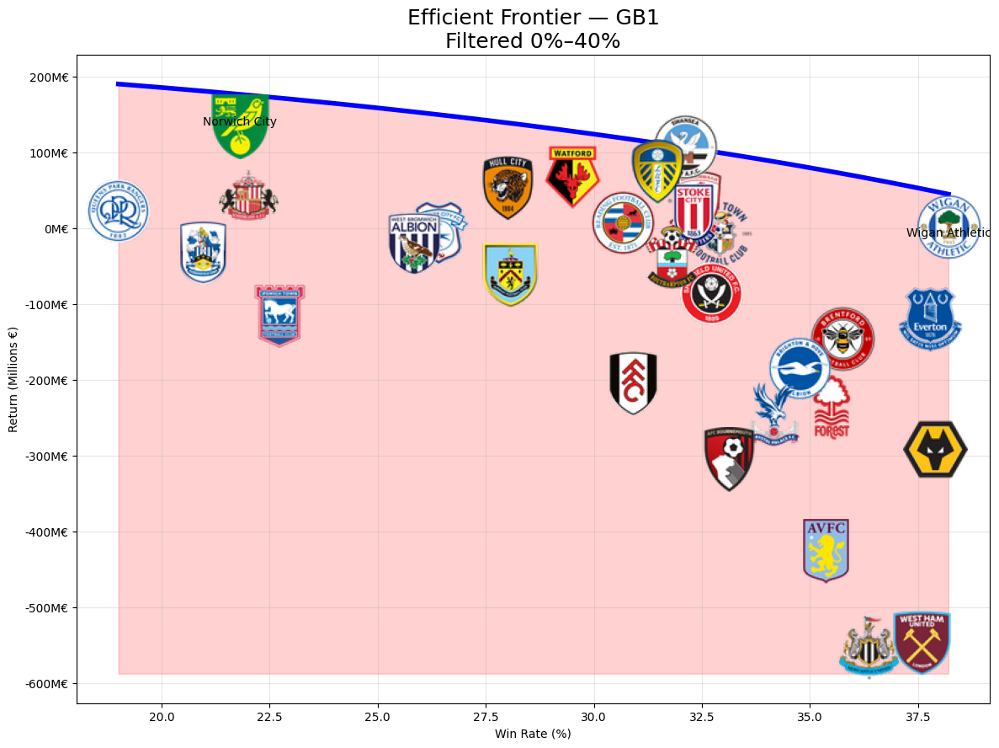

In [58]:
fig_mpl, fig_plotly, tab = efficient_frontier_filtered(
    return_on_performance_df,
    league="GB1",
    min_win_rate=0,
    max_win_rate=40
)